# __개인 대출 부도 분석 및 예측 모델링__

__§ TEAM KIM__

- 전북은행 리스크관리부 계장 김용갑  
- 전북은행 리스크관리부 계장 김남교

### <span style='black'> **§§ Table of Contents**</span>

[**I. Introduction**](#Introduction)  

[**II. Data Exploratory**](#DATA탐색)  
- [Data preprocessing](#DP) 
- [Missing values](#결측치탐색)  

[**III. Feature Engineering**](#FE)
- [Information Value](#IV)  
- [Fine classing and Coarse classing for Categorical features](#CA)  
- [Fine classing and Coarse classing for Numerical features](#NU)  
- [Candidated Features](#CF)  

[**IV. Prediction model**](#PD)
- [Logistic model](#LM)  
- [Logistic model with ridge penalty](#R)
- [Scorecard](#SC)

## Ⅰ. Introduction <a class='anchor' id="Introduction">

- 라이브러리

In [1]:
# basic
import pandas as pd
import numpy as np
from numpy import inf

import random
import itertools
import missingno as msno
import seaborn as sns
import plotly.graph_objs as go
import plotly
import matplotlib.pyplot as plt

from IPython.display import Image

from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_recall_curve, auc

from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from numpy import arange
from sklearn import metrics

from sklearn.pipeline import Pipeline
from scipy.stats import ks_2samp

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
pd.set_option('display.max_columns', 50)
pd.set_option('display.width', 1000)
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'NanumGothic' 
plt.rcParams['font.size'] = 10
pal = sns.color_palette('viridis')

- 경로

In [4]:
pwd

'/Users/yonggab/Documents/Challenge'

In [5]:
ls data/

loan_customer.csv


- Data upload

In [4]:
df = pd.read_csv('../0.data/loan_customer.csv')

## II. Data Exploratory<a class='anchor' id="DATA탐색">

### • Data preprocessing <a class='anchor' id="DP">

In [5]:
df.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,CB_SCORE_1,CB_SCORE_2,CB_SCORE_3,TARGET
0,100002,Cash loans,M,Y,0,202500.0,NaN,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461.0,-637.0,-3648.0,-2120.0,1,1,0,1,0,2,WEDNESDAY,10,0,0,0,Business Entity Type 3,0,1,0,NaN,NaN,58.349224,1
1,100004,Revolving loans,NaN,NaN,0,67500.0,135000.0,Working,Secondary / secondary special,Single / not married,House / apartment,NaN,-19046.0,NaN,-4260.0,-2531.0,1,1,1,1,0,2,MONDAY,9,0,0,0,Government,0,0,0,26.499494,57.600542,46.433666,0
2,100020,Cash loans,M,N,0,108000.0,509602.5,Working,Secondary / secondary special,Married,House / apartment,0.018634,-12931.0,NaN,NaN,-3866.0,1,1,0,0,0,2,THURSDAY,12,1,1,0,Government,0,1,0,NaN,63.496369,NaN,0
3,100029,Cash loans,M,N,2,135000.0,NaN,Working,Secondary / secondary special,Married,House / apartment,0.026392,-11286.0,-746.0,-108.0,NaN,1,1,0,0,0,2,THURSDAY,14,0,1,1,Business Entity Type 3,0,1,0,82.376245,45.996152,68.694333,0
4,100048,Cash loans,NaN,Y,0,202500.0,604152.0,Working,Secondary / secondary special,Married,House / apartment,0.009175,NaN,-475.0,NaN,-513.0,1,1,0,1,0,2,MONDAY,12,0,1,1,Industry: type 1,0,1,0,66.199985,NaN,NaN,0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 35 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   SK_ID_CURR                  24000 non-null  int64  
 1   NAME_CONTRACT_TYPE          24000 non-null  object 
 2   CODE_GENDER                 16906 non-null  object 
 3   FLAG_OWN_REALTY             14429 non-null  object 
 4   CNT_CHILDREN                24000 non-null  int64  
 5   AMT_INCOME_TOTAL            24000 non-null  float64
 6   AMT_CREDIT                  16700 non-null  float64
 7   NAME_INCOME_TYPE            24000 non-null  object 
 8   NAME_EDUCATION_TYPE         24000 non-null  object 
 9   NAME_FAMILY_STATUS          24000 non-null  object 
 10  NAME_HOUSING_TYPE           24000 non-null  object 
 11  REGION_POPULATION_RELATIVE  16851 non-null  float64
 12  DAYS_BIRTH                  19251 non-null  float64
 13  DAYS_EMPLOYED               168

In [7]:
round(df.describe(),2)

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,CB_SCORE_1,CB_SCORE_2,CB_SCORE_3,TARGET
count,24000.00,24000.00,2.400000e+04,16700.00,16851.00,19251.00,16851.00,14267.00,19259.00,24000.0,24000.00,24000.0,24000.00,24000.00,24000.00,24000.00,24000.00,24000.00,24000.00,24000.00,24000.00,24000.00,17854.00,15726.00,16892.00,24000.00
mean,277994.34,0.42,1.725182e+05,595425.43,0.02,-16026.53,63041.87,-5016.93,-2990.49,1.0,0.82,0.2,0.28,0.06,2.05,12.06,0.08,0.23,0.18,0.00,0.71,0.00,49.94,58.06,60.37,0.08
std,102778.81,0.73,7.604603e+05,398812.55,0.01,4365.27,140634.05,3541.62,1513.09,0.0,0.38,0.4,0.45,0.23,0.51,3.25,0.27,0.42,0.39,0.01,0.45,0.01,13.10,10.75,8.68,0.28
min,100002.00,0.00,2.700000e+04,45000.00,0.00,-25197.00,-16852.00,-24672.00,-6263.00,1.0,0.00,0.0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,28.97,0.00
25%,188705.25,0.00,1.125000e+05,270000.00,0.01,-19647.00,-2772.00,-7537.00,-4308.00,1.0,1.00,0.0,0.00,0.00,2.00,10.00,0.00,0.00,0.00,0.00,0.00,0.00,41.03,50.80,54.41,0.00
50%,277908.50,0.00,1.440000e+05,510853.50,0.02,-15731.00,-1206.00,-4521.00,-3251.00,1.0,1.00,0.0,0.00,0.00,2.00,12.00,0.00,0.00,0.00,0.00,1.00,0.00,49.89,57.94,59.97,0.00
75%,366537.25,1.00,2.025000e+05,808650.00,0.03,-12376.50,-299.00,-2050.50,-1717.50,1.0,1.00,0.0,1.00,0.00,2.00,14.00,0.00,0.00,0.00,0.00,1.00,0.00,58.92,65.18,66.10,0.00
max,456228.00,7.00,1.170000e+08,4050000.00,0.07,-7688.00,365243.00,0.00,0.00,1.0,1.00,1.0,1.00,1.00,3.00,23.00,1.00,1.00,1.00,1.00,1.00,1.00,99.87,98.99,100.00,1.00


In [8]:
df[df.AMT_INCOME_TOTAL==df.AMT_INCOME_TOTAL.max()]

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,CB_SCORE_1,CB_SCORE_2,CB_SCORE_3,TARGET
991,114967,Cash loans,F,Y,1,117000000.0,562491.0,Working,Secondary / secondary special,Married,House / apartment,0.010643,-12615.0,NaN,NaN,-3643.0,1,1,0,0,0,2,TUESDAY,14,0,0,0,Business Entity Type 3,0,1,0,79.863659,52.373718,NaN,1


- Datatype 변환

In [9]:
df["FLAG_MOBIL"] = df["FLAG_MOBIL"].astype(str)
df["FLAG_EMP_PHONE"] = df["FLAG_EMP_PHONE"].astype(str)
df["FLAG_WORK_PHONE"] = df["FLAG_WORK_PHONE"].astype(str)
df["FLAG_PHONE"] = df["FLAG_PHONE"].astype(str)
df["FLAG_EMAIL"] = df["FLAG_EMAIL"].astype(str)
                                           
df["REG_CITY_NOT_LIVE_CITY"] = df["REG_CITY_NOT_LIVE_CITY"].astype(str)
df["REG_CITY_NOT_WORK_CITY"] = df["REG_CITY_NOT_WORK_CITY"].astype(str)
df["LIVE_CITY_NOT_WORK_CITY"] = df["LIVE_CITY_NOT_WORK_CITY"].astype(str)         
df["HOUR_APPR_PROCESS_START"]=df["HOUR_APPR_PROCESS_START"].astype(str)

df["REGION_RATING_CLIENT"]=df["REGION_RATING_CLIENT"].astype(str)

df["FLAG_DOCUMENT_2"]=df["FLAG_DOCUMENT_2"].astype(str)
df["FLAG_DOCUMENT_3"]=df["FLAG_DOCUMENT_3"].astype(str)
df["FLAG_DOCUMENT_4"]=df["FLAG_DOCUMENT_4"].astype(str)

In [10]:
#  0 : 무직
df['DAYS_EMPLOYED'] = df['DAYS_EMPLOYED'].apply(lambda x: 0 if x > 0 else x)

In [11]:
df["AGE"] = -df.DAYS_BIRTH/365 # 연령
df["EMPLOYED"] = -df.DAYS_EMPLOYED/365 #근속연수
df["ABILITY"] = df.AMT_INCOME_TOTAL/df.EMPLOYED #근속연수 대비 수익
df["ABILITY"][df["ABILITY"]==-inf] = 0

df["ABILITY_FAM"] = df.AMT_INCOME_TOTAL/df.CNT_CHILDREN
df["ABILITY_FAM"][df["ABILITY_FAM"]==inf] = 0

df["AGE"] = -df.DAYS_BIRTH/365 # 연령
df["YEARS_REGISTRATION"] = -df.DAYS_REGISTRATION/365 
df["YEARS_ID_PUBLISH"] = -df.DAYS_ID_PUBLISH/365 
df["YEARS_EMPLOYED"] = -df.DAYS_EMPLOYED/365 #근속연수

In [12]:
df["CNT_CHILDREN"] = df["CNT_CHILDREN"].astype(str)

In [13]:
round(df.describe(),2)

,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CB_SCORE_1,CB_SCORE_2,CB_SCORE_3,TARGET,AGE,EMPLOYED,ABILITY,ABILITY_FAM,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_EMPLOYED
count,24000.00,2.400000e+04,16700.00,16851.00,19251.00,16851.00,14267.00,19259.00,17854.00,15726.00,16892.00,24000.00,19251.00,16851.00,16851.00,2.400000e+04,14267.00,19259.00,16851.00
mean,277994.34,1.725182e+05,595425.43,0.02,-16026.53,-1961.03,-5016.93,-2990.49,49.94,58.06,60.37,0.08,43.91,5.37,64451.24,4.681243e+04,13.75,8.19,5.37
std,102778.81,7.604603e+05,398812.55,0.01,4365.27,2311.35,3541.62,1513.09,13.10,10.75,8.68,0.28,11.96,6.33,253661.81,7.596225e+05,9.70,4.15,6.33
min,100002.00,2.700000e+04,45000.00,0.00,-25197.00,-16852.00,-24672.00,-6263.00,0.00,0.00,28.97,0.00,21.06,-0.00,0.00,0.000000e+00,-0.00,-0.00,-0.00
25%,188705.25,1.125000e+05,270000.00,0.01,-19647.00,-2772.00,-7537.00,-4308.00,41.03,50.80,54.41,0.00,33.91,0.82,8697.09,0.000000e+00,5.62,4.71,0.82
50%,277908.50,1.440000e+05,510853.50,0.02,-15731.00,-1206.00,-4521.00,-3251.00,49.89,57.94,59.97,0.00,43.10,3.30,25966.51,0.000000e+00,12.39,8.91,3.30
75%,366537.25,2.025000e+05,808650.00,0.03,-12376.50,-299.00,-2050.50,-1717.50,58.92,65.18,66.10,0.00,53.83,7.59,63993.51,6.750000e+04,20.65,11.80,7.59
max,456228.00,1.170000e+08,4050000.00,0.07,-7688.00,0.00,0.00,0.00,99.87,98.99,100.00,1.00,69.03,46.17,27375000.00,1.170000e+08,67.59,17.16,46.17


In [14]:
cat_features = df.select_dtypes(include = 'object').columns.tolist()
num_features = df.select_dtypes(include = 'number').columns.tolist()[1:]
num_features.remove('TARGET')

In [15]:
cat_features

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4']

In [16]:
num_features

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'CB_SCORE_1',
 'CB_SCORE_2',
 'CB_SCORE_3',
 'AGE',
 'EMPLOYED',
 'ABILITY',
 'ABILITY_FAM',
 'YEARS_REGISTRATION',
 'YEARS_ID_PUBLISH',
 'YEARS_EMPLOYED']

In [17]:
len(cat_features), len(num_features)

(23, 17)

- Numeric 변수

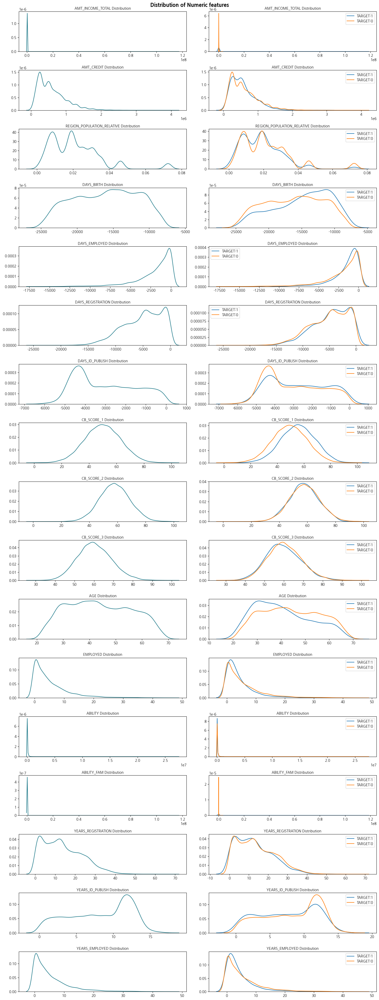

In [18]:
fig, ax = plt.subplots(nrows=len(num_features), ncols=2, figsize = (15, 40))

for i, column in enumerate(num_features):
    sns.kdeplot(df[column], ax=ax[i,0], color=pal[2])
    
    ax[i,0].set_title(f'{column} Distribution', size = 10)
    ax[i,0].set_xlabel(None)
    ax[i,0].set_ylabel(None)
    
for j, column in enumerate(num_features):
   
    sns.kdeplot(df[df['TARGET']==1][column],ax=ax[j,1])
    ax[j,1].legend(['TARGET:1', 'TARGET:0'])
    sns.kdeplot(df[df['TARGET']==0][column],ax=ax[j,1])
    ax[j,1].legend(['TARGET:1', 'TARGET:0'])
    ax[j,1].set_title(f'{column} Distribution', size = 10)
    ax[j,1].set_xlabel(None)
    ax[j,1].set_ylabel(None)    
    
fig.suptitle('Distribution of Numeric features\n\n', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

- Categorical 변수 (Character)

Text(0.5, 1.0, 'CNT_CHILDREN')

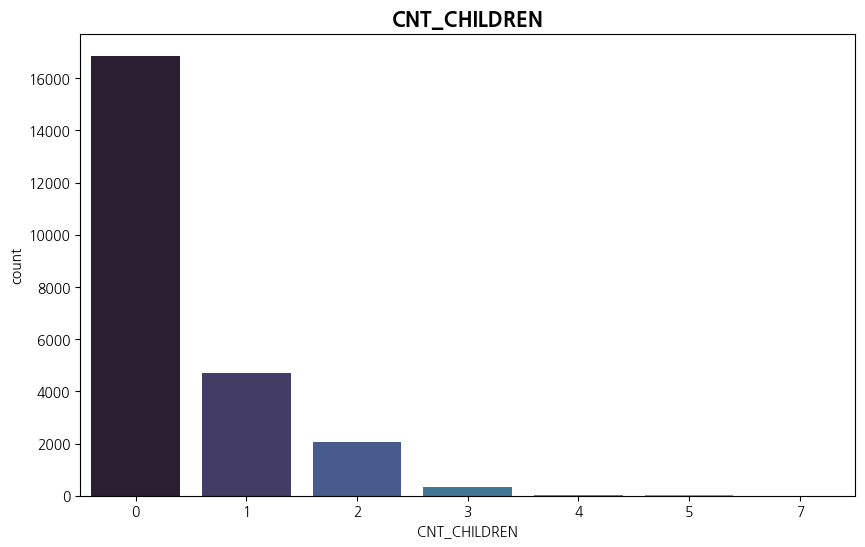

In [19]:
fig, axs = plt.subplots(figsize=(10,6),nrows=1, ncols=1) 
sns.countplot(x=df['CNT_CHILDREN'], palette = 'mako',order = df['CNT_CHILDREN'].value_counts().index)
plt.title('CNT_CHILDREN', fontsize = 15, weight = 'bold')

In [20]:
# Pie chart를 그리기 위한 함수 정의
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:,})".format(pct,absolute)

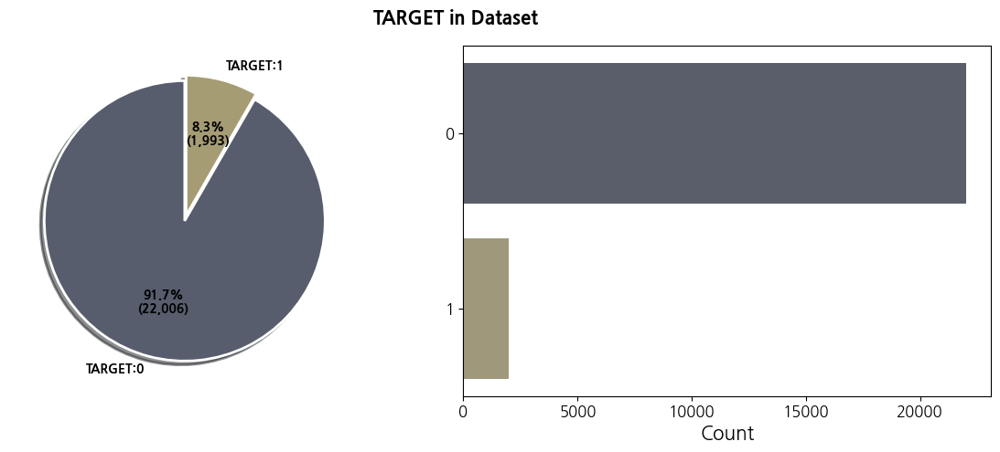

In [21]:
fig, ax = plt.subplots(1, 2, figsize = (12, 5))
ax = ax.flatten()
cnt = df['TARGET'].value_counts()
labels = cnt.index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("cividis", num_unique_categories)
ax[0].pie(
    df['TARGET'].value_counts(), 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=["TARGET:0","TARGET:1"],colors=colors,explode=(0,0.04))

sns.countplot(data = df, y = 'TARGET', ax = ax[1], palette = 'cividis', order = df['TARGET'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('TARGET in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

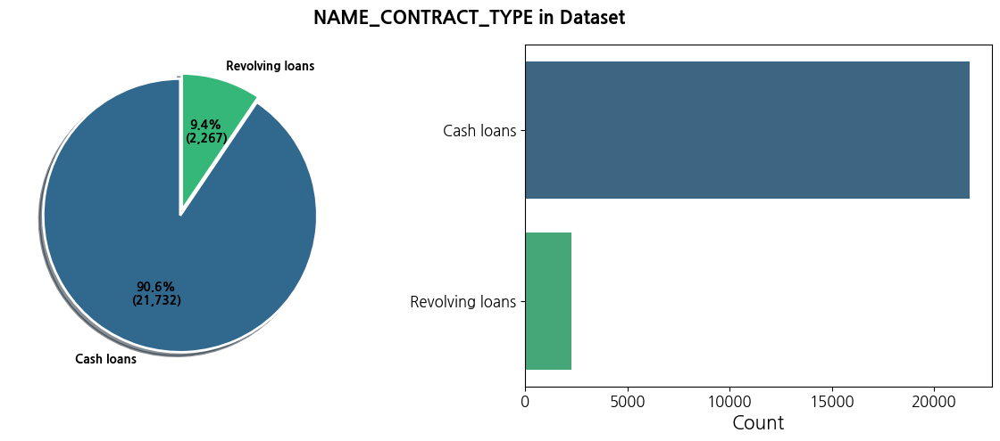

In [22]:
fig, ax = plt.subplots(1, 2, figsize = (12, 5))
ax = ax.flatten()
cnt = df['NAME_CONTRACT_TYPE'].value_counts()
labels = cnt.index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("viridis", num_unique_categories)
ax[0].pie(
    df['NAME_CONTRACT_TYPE'].value_counts(), 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=["Cash loans","Revolving loans"],colors=colors,explode=(0,0.04))

sns.countplot(data = df, y = 'NAME_CONTRACT_TYPE', ax = ax[1], palette = 'viridis', order = df['NAME_CONTRACT_TYPE'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('NAME_CONTRACT_TYPE in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

In [23]:
# basic
import pandas as pd
import numpy as np
from numpy import inf

import seaborn as sns
import plotly.graph_objs as go
import plotly
import matplotlib.pyplot as plt

# imputation
import random
import itertools
import missingno as msno
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestClassifier

from IPython.display import Image

from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV, KFold
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_recall_curve, auc
from sklearn.pipeline import Pipeline
from scipy.stats import chi2_contingency

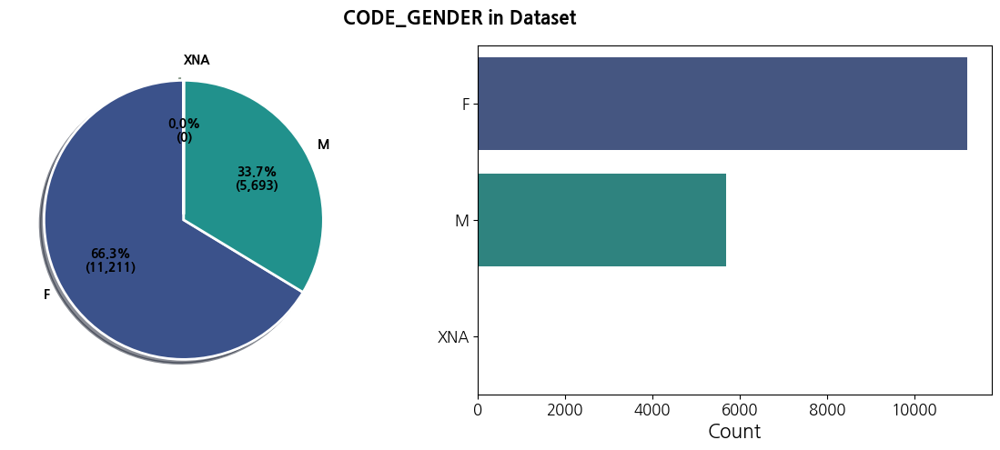

In [24]:
fig, ax = plt.subplots(1, 2, figsize = (12, 5))
ax = ax.flatten()
cnt = df['CODE_GENDER'].value_counts()
labels = cnt.index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("viridis", num_unique_categories)
ax[0].pie(
    df['CODE_GENDER'].value_counts(), 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=["F","M","XNA"],colors=colors,explode=(0,0,0.04))

sns.countplot(data = df, y = 'CODE_GENDER', ax = ax[1], palette = 'viridis', order = df['CODE_GENDER'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('CODE_GENDER in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

In [25]:
df = df.loc[df.CODE_GENDER!="XNA"]

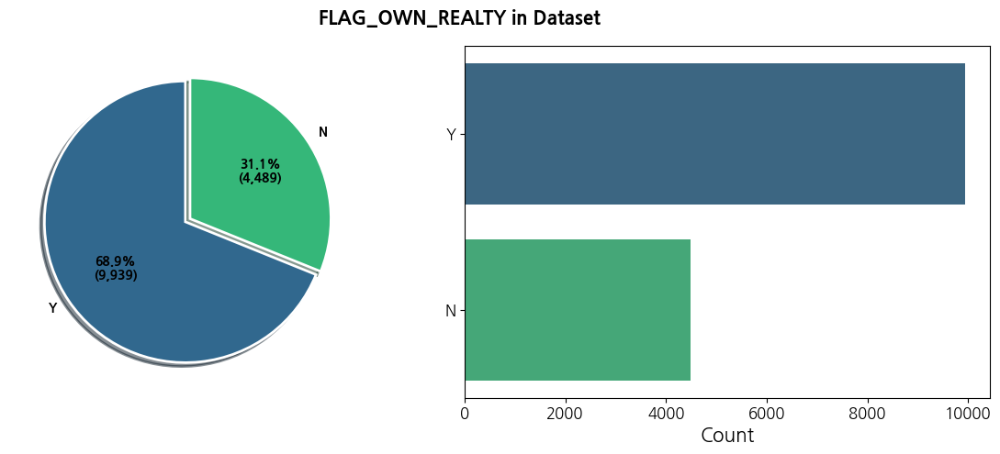

In [26]:
fig, ax = plt.subplots(1, 2, figsize = (12, 5))
ax = ax.flatten()
cnt = df['FLAG_OWN_REALTY'].value_counts()
labels = cnt.index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("viridis", num_unique_categories)
ax[0].pie(
    df['FLAG_OWN_REALTY'].value_counts(), 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=["Y","N"],colors=colors,explode=(0,0.04))

sns.countplot(data = df, y = 'FLAG_OWN_REALTY', ax = ax[1], palette = 'viridis', order = df['FLAG_OWN_REALTY'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('FLAG_OWN_REALTY in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

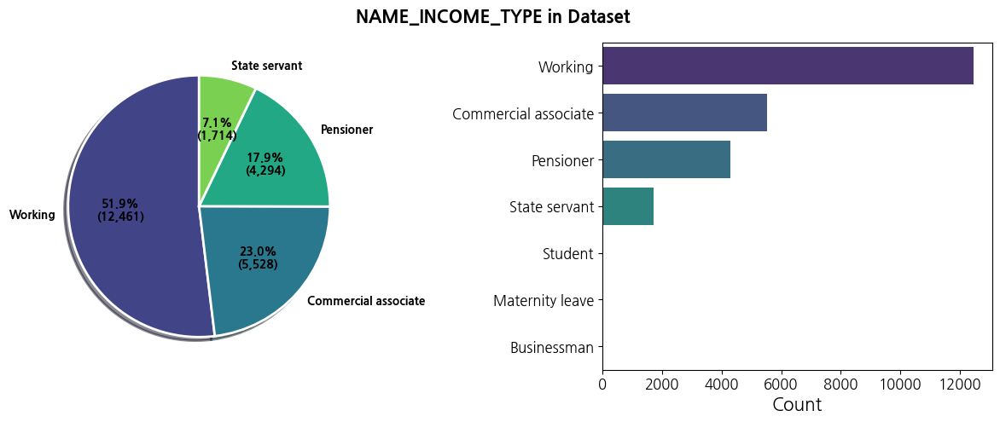

In [27]:
fig, ax = plt.subplots(1, 2, figsize = (12, 5))
ax = ax.flatten()
cnt = df['NAME_INCOME_TYPE'].value_counts()
labels = cnt[cnt >500].index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("viridis", num_unique_categories)
ax[0].pie(
    cnt[cnt >500], 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=labels,colors=colors,explode=(0,0,0,0))
sns.countplot(data = df, y = 'NAME_INCOME_TYPE', ax = ax[1], palette = 'viridis', order = df['NAME_INCOME_TYPE'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('NAME_INCOME_TYPE in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

In [28]:
df = df[df.NAME_INCOME_TYPE != 'Maternity leave']
df = df[df.NAME_INCOME_TYPE != 'Student']
df = df[df.NAME_INCOME_TYPE != 'Businessman']

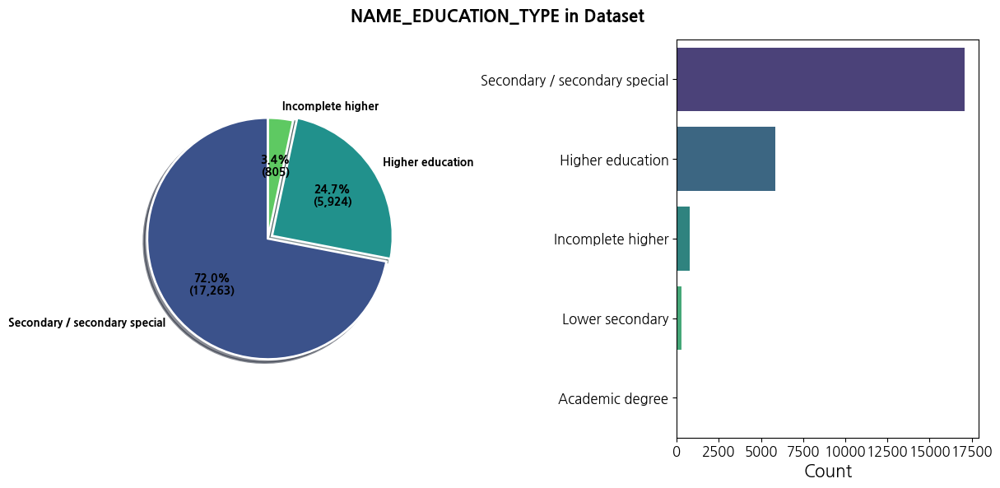

In [29]:
fig, ax = plt.subplots(1, 2, figsize = (12, 6))
ax = ax.flatten()
cnt = df['NAME_EDUCATION_TYPE'].value_counts()
labels = cnt[cnt>700].index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("viridis", num_unique_categories)
ax[0].pie(
    cnt[cnt>700], 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=labels,colors=colors,explode=(0,0.04,0))

sns.countplot(data = df, y = 'NAME_EDUCATION_TYPE', ax = ax[1], palette = 'viridis', order = df['NAME_EDUCATION_TYPE'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('NAME_EDUCATION_TYPE in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

In [30]:
df["NAME_EDUCATION_TYPE_2"] = df.NAME_EDUCATION_TYPE
df.NAME_EDUCATION_TYPE_2[df.NAME_EDUCATION_TYPE_2 == 'Academic degree'] = "Higher education"

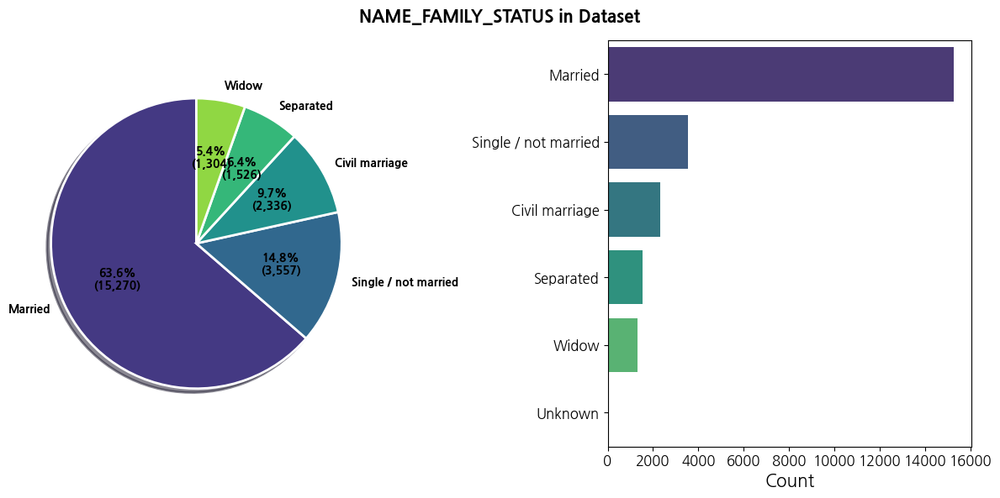

In [31]:
fig, ax = plt.subplots(1, 2, figsize = (12, 6))
ax = ax.flatten()
cnt = df['NAME_FAMILY_STATUS'].value_counts()
labels = cnt[cnt>10].index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("viridis", num_unique_categories)
unique_values = len(df['NAME_FAMILY_STATUS'].value_counts())
ax[0].pie(
    cnt[cnt>10], 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=labels,colors=colors,explode=[0] * len(cnt[cnt>10]))

sns.countplot(data = df, y = 'NAME_FAMILY_STATUS', ax = ax[1], palette = 'viridis', order = df['NAME_FAMILY_STATUS'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('NAME_FAMILY_STATUS in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

In [32]:
df = df[df.NAME_FAMILY_STATUS != 'Unknown']

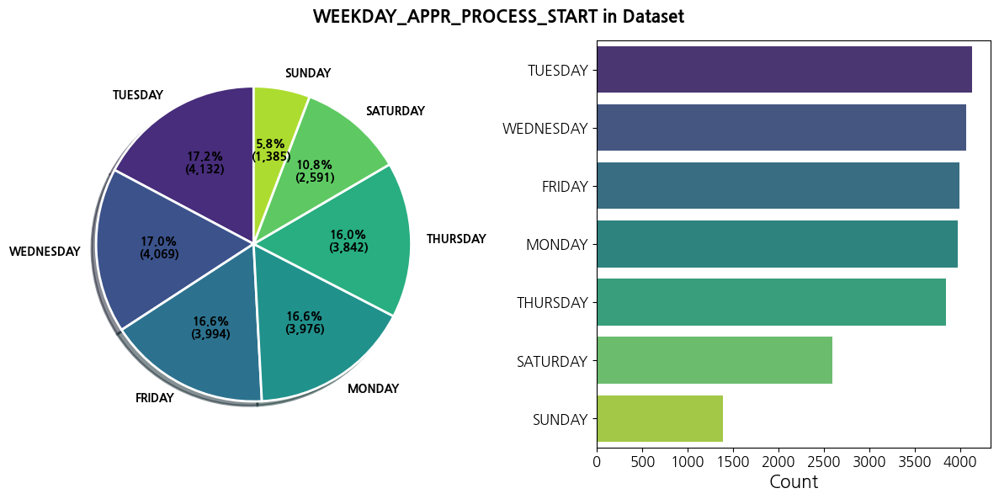

In [33]:
fig, ax = plt.subplots(1, 2, figsize = (12, 6))
ax = ax.flatten()
cnt = df['WEEKDAY_APPR_PROCESS_START'].value_counts()
labels = cnt.index.tolist()
num_unique_categories = len(labels)
colors = sns.color_palette("viridis", num_unique_categories)
unique_values = len(df['WEEKDAY_APPR_PROCESS_START'].value_counts())
ax[0].pie(
    df['WEEKDAY_APPR_PROCESS_START'].value_counts(), 
    shadow = True, 
    autopct=lambda pct : func(pct,cnt),
                              wedgeprops={'linewidth':2.0, 'edgecolor':'white'},
                              textprops={'fontweight':'bold'},
                              startangle=90, 
                              labels=labels,colors=colors,explode=[0] * unique_values)

sns.countplot(data = df, y = 'WEEKDAY_APPR_PROCESS_START', ax = ax[1], palette = 'viridis', order = df['WEEKDAY_APPR_PROCESS_START'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 15)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('WEEKDAY_APPR_PROCESS_START in Dataset', fontsize = 15, fontweight = 'bold')
plt.tight_layout()

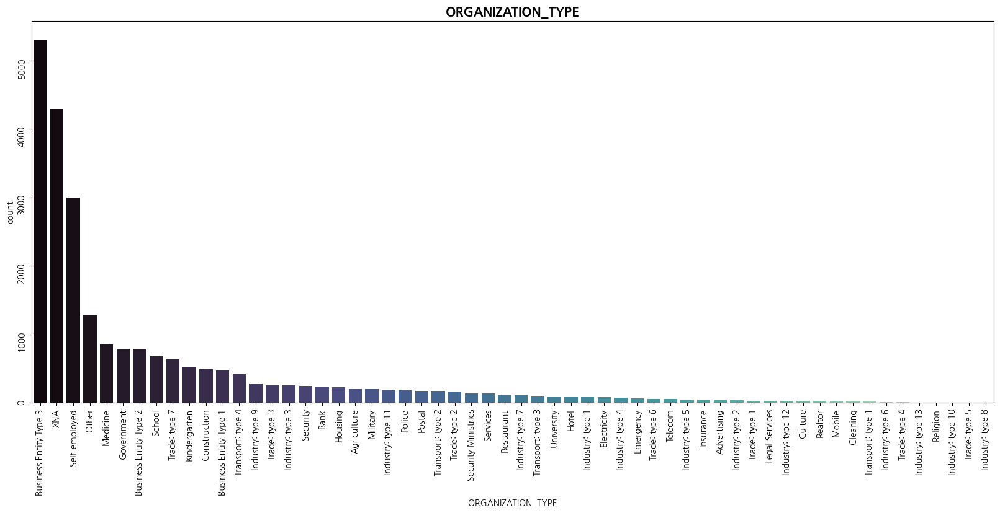

In [34]:
fig, axs = plt.subplots(figsize=(20,8),nrows=1, ncols=1) 
sns.countplot(x=df['ORGANIZATION_TYPE'], palette = 'mako',order = df['ORGANIZATION_TYPE'].value_counts().index)
plt.title('ORGANIZATION_TYPE', fontsize = 15, weight = 'bold')
axs.tick_params(rotation=90) 

In [37]:
def categorize_org_type(org_type):
    if 'business' in org_type.lower():
        return 'Business'
    elif 'industry' in org_type.lower():
        return 'Industry'
    elif 'trade'in org_type.lower():
        return 'trade'
    elif 'xna' in org_type.lower():
        return 'xna'
    elif 'self-employed' in org_type.lower():
        return 'self-employed'
    else:
        return 'Other'

In [38]:
df['ORGANIZATION_TYPE_2'] = df['ORGANIZATION_TYPE'].apply(categorize_org_type)

Text(0.5, 1.0, 'ORGANIZATION_TYPE_2')

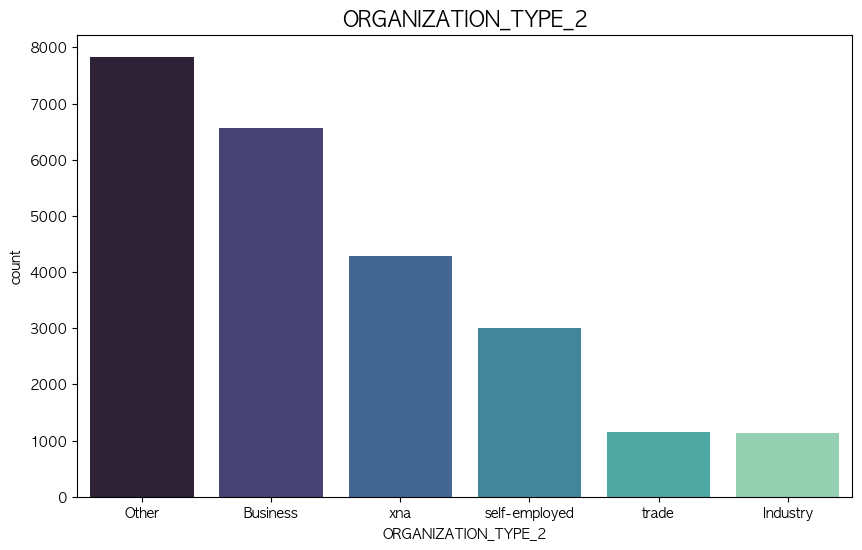

In [39]:
fig, axs = plt.subplots(figsize=(10,6),nrows=1, ncols=1) 
sns.countplot(x=df['ORGANIZATION_TYPE_2'], palette = 'mako',order = df['ORGANIZATION_TYPE_2'].value_counts().index)
plt.title('ORGANIZATION_TYPE_2', fontsize = 15, weight = 'bold')

In [40]:
cat_features_2 = df.select_dtypes(include = 'object').columns.tolist()
cat_features_2.remove('FLAG_MOBIL')
cat_features_2.remove('FLAG_DOCUMENT_2')
cat_features_2.remove('FLAG_DOCUMENT_4')
cat_features_2.remove('ORGANIZATION_TYPE')
cat_features_2.remove('NAME_EDUCATION_TYPE')

In [41]:
len(cat_features_2)

20

In [42]:
num_features_2 = df.select_dtypes(include = 'number').columns.tolist()
num_features_2.remove('SK_ID_CURR')
num_features_2.remove('TARGET')

In [43]:
df.DAYS_BIRTH = -df.DAYS_BIRTH 
df.DAYS_EMPLOYED = -df.DAYS_EMPLOYED
df.DAYS_REGISTRATION = -df.DAYS_REGISTRATION
df.DAYS_ID_PUBLISH = -df.DAYS_ID_PUBLISH

### • Missing values<a class='anchor' id="결측치탐색">

In [44]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("우리 Data frame 은 총 " + str(df.shape[1]) + " columns이 있으며,"      
            "이 중 " + str(mis_val_table_ren_columns.shape[0]) +
              " column이 결측치를 가지고 있음")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [45]:
missing_values_table(df)

우리 Data frame 은 총 44 columns이 있으며,이 중 17 column이 결측치를 가지고 있음


,Missing Values,% of Total Values
YEARS_REGISTRATION,9730,40.6
DAYS_REGISTRATION,9730,40.6
FLAG_OWN_REALTY,9568,39.9
CB_SCORE_2,8273,34.5
AMT_CREDIT,7296,30.4
YEARS_EMPLOYED,7148,29.8
EMPLOYED,7148,29.8
REGION_POPULATION_RELATIVE,7148,29.8
DAYS_EMPLOYED,7148,29.8
ABILITY,7148,29.8


①대출 신청 이전에 고객이 등록정보를 변경한 시점 사이의 일수(기준 시점 대비 상대적인 시간), ②자가부동산 보유 여부, ③신용점수2 순으로 결측치 비율이 높음.

- 결측이 발생 사유 [참고]

_1. Missing Completely at Random (MCAR)_

The missing values on a given variable (Y) are not associated with other variables in a given data set or with the variable (Y) itself. In other words, there is no particular reason for the missing values.

_2. Missing at Random (MAR)_

MAR occurs when the missingness is not random, but where missingness can be fully accounted for by variables where there is complete information.

_3. Missing Not at Random (MNAR)_

Missingness depends on unobserved data or the value of the missing data itself.


<Wikipedia: https://en.wikipedia.org/wiki/Missing_data 발췌>

결측치를 처리하기 전에 결측이 발생한 이유가 위 세가지 중 어떤 것에 해당하는지 확인하기 위하여 다양한 시각화 기법을 활용함.

<AxesSubplot: >

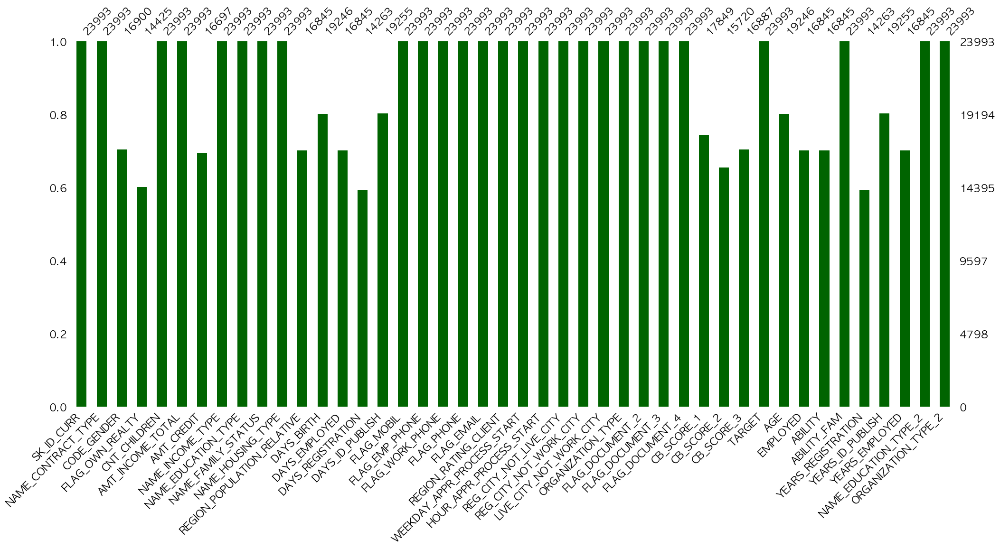

In [46]:
# Bar차트
msno.bar(df,color='darkgreen')

<AxesSubplot: >

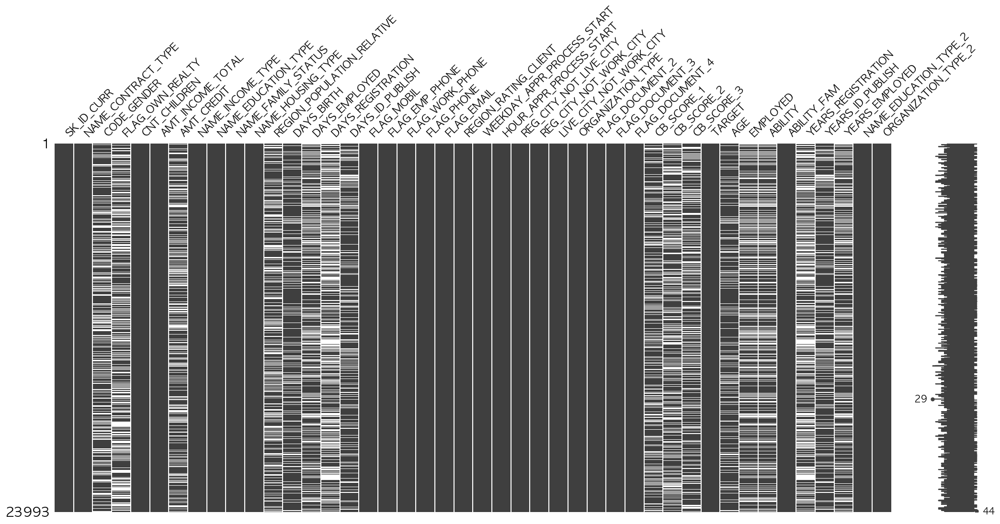

In [47]:
# Matrix
msno.matrix(df)

23,993건에 대해서 결측치 matrix를 그렸을 때에는 결측이 발생하는 패턴을 확인하기 어려움.
결측치를 가장 많이 가지고 있는 대출건(sk_id_curr)에는 15개의 결측값이 존재함.

<AxesSubplot: >

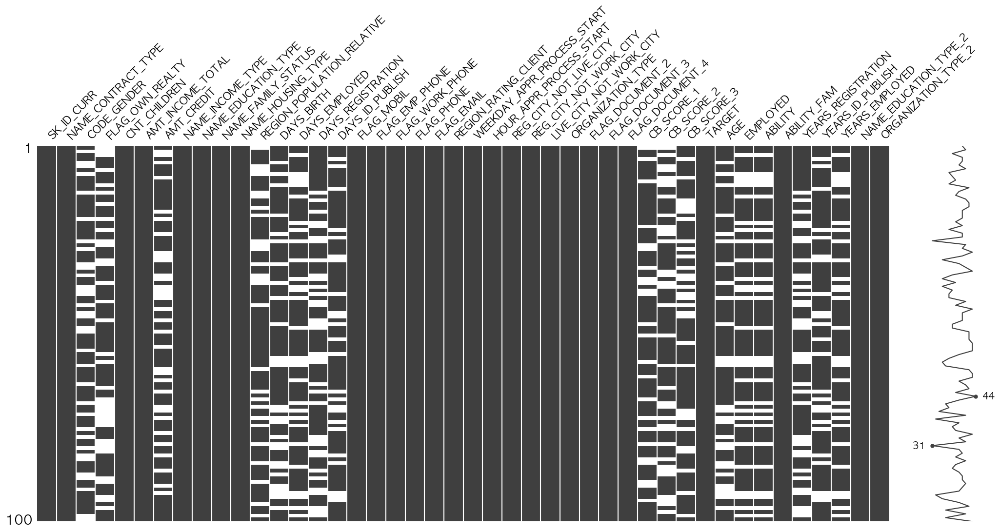

In [48]:
msno.matrix(df.sample(100))

임의로 100개의 대출건을 추출하여 결측 matrix를 살펴보아도 결측 발생 패턴을 확인하기 어려움.  
특정 숫자형 변수에 결측 발생이 영향을 받는지 살펴보았음.

<AxesSubplot: >

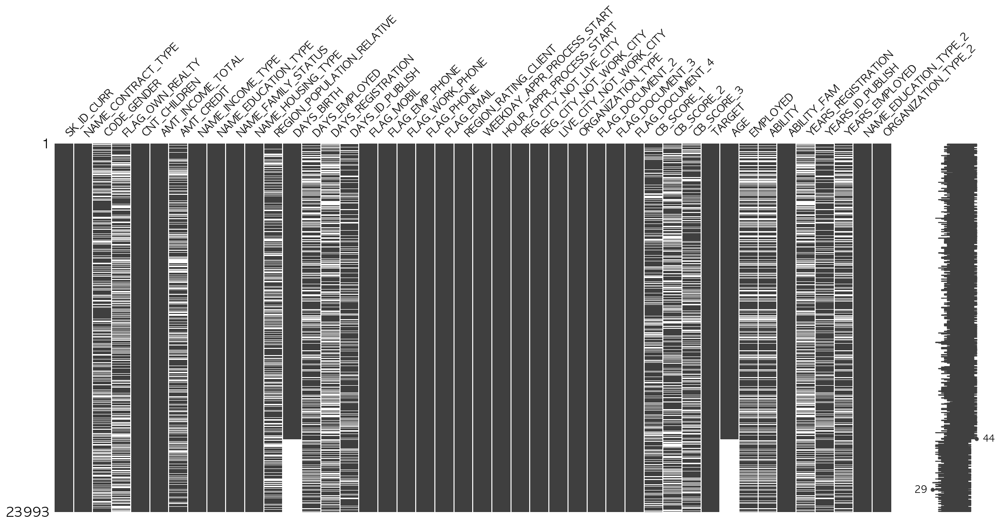

In [49]:
# 대출신청 시점에서의 일단위 나이가 결측 발생에 영향을 주는지,
sorted = df.sort_values('DAYS_BIRTH') 
msno.matrix(sorted)

대출 신청 시점의 일단위 나이와 결측치 발생에 특별한 관련이 있는 것처럼 보이진 않음.
관련이 있다면 나이가 어리거나 많을수록 결측 발생이 많이 일어나거나 하는 패턴이 나타날텐데, 그러한 특징을 발견하기 어려움.

<AxesSubplot: >

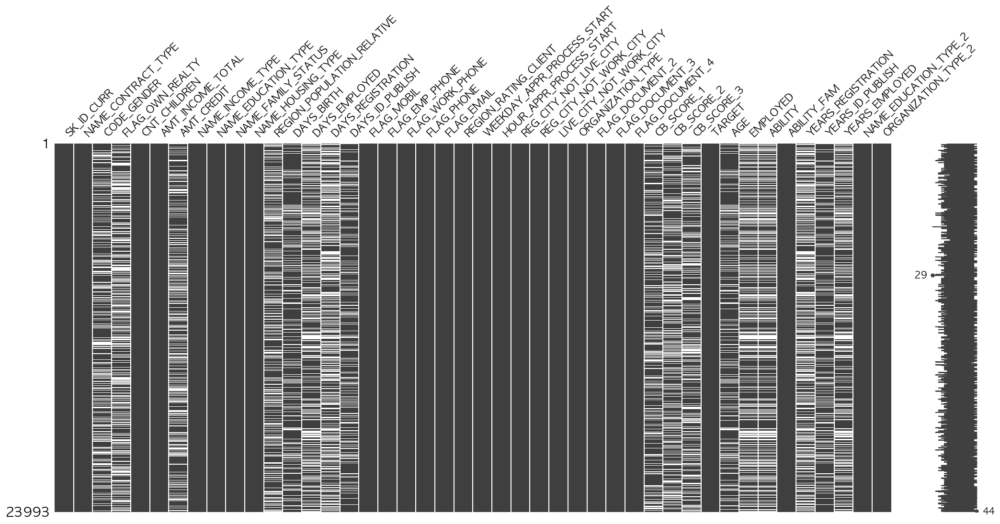

In [50]:
# 학력에 따라 결측치 발생의 패턴이 존재하는지,
sorted = df.sort_values('NAME_EDUCATION_TYPE') 
msno.matrix(sorted)

<AxesSubplot: >

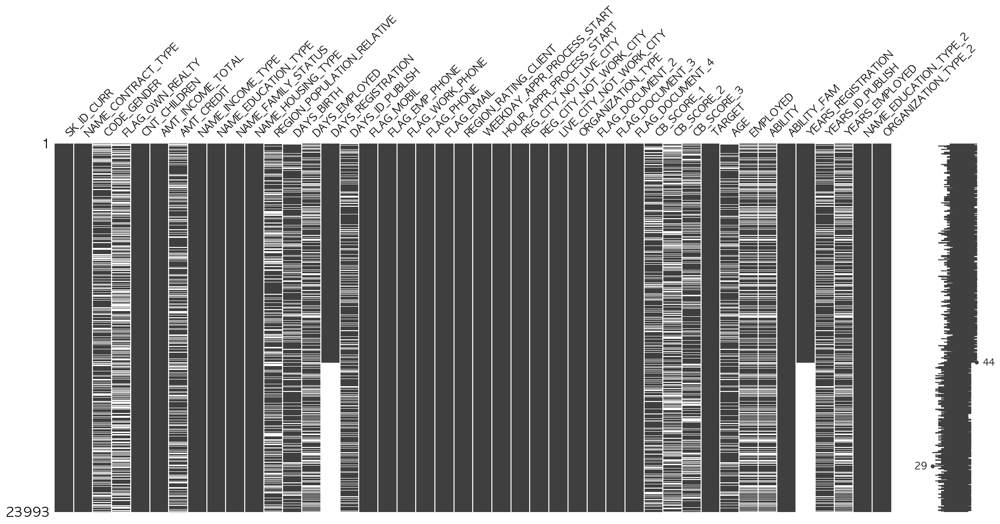

In [51]:
# 대출 신청 이전에 고객이 등록정보를 변경한 시점 사이의 일수에 따라 결측치 발생의 패턴이 존재하는지,
sorted = df.sort_values('DAYS_REGISTRATION') 
msno.matrix(sorted)

<AxesSubplot: >

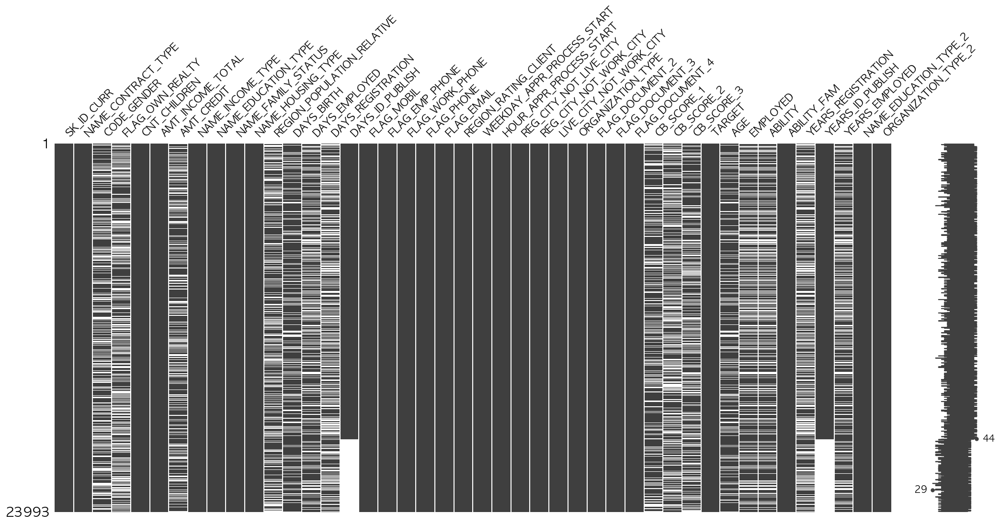

In [52]:
# 대출 신청 이전에 고객이 신분증을 변경한 시점 사이의 일수에 따라 결측치 발생의 패턴이 존재하는지,
sorted = df.sort_values('DAYS_ID_PUBLISH') 
msno.matrix(sorted)

이외 변수들에 대해서도 위와 같이 살펴본 결과, 결측 발생 패턴을 확인하는데 어려움이 있었음.

<AxesSubplot: >

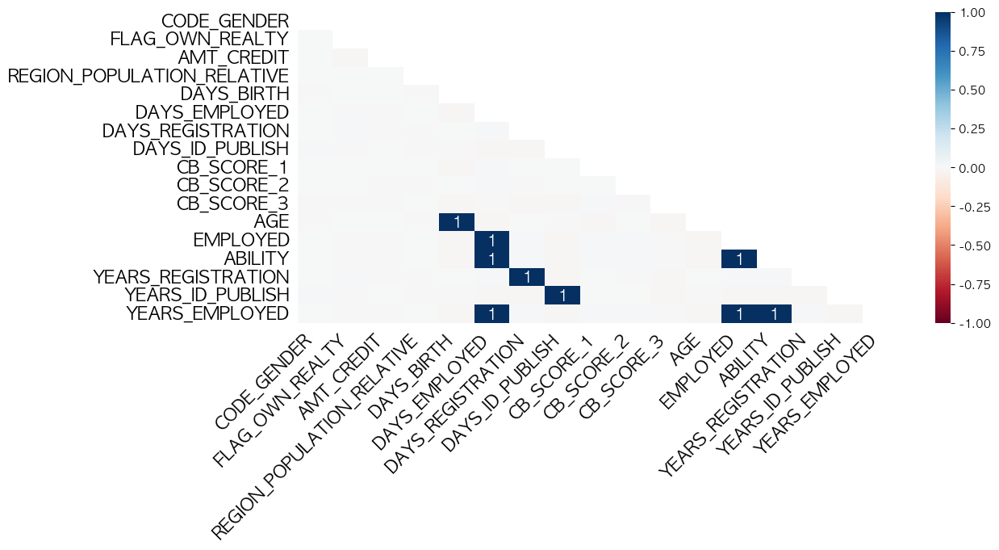

In [53]:
# HeatMap
msno.heatmap(df,figsize=(12,5))

HeatMap을 통해 변수들의 결측치 발생에 대한 상관관계를 확인할 수 있는데, 해당 데이터의 경우에는 파생변수를 제외하고 결측치 발생에 대한 상관관계가 거의 없음을 확인할 수 있었음. 서로 결측치 발생에 대한 영향을 주지 않는다고 볼 수 있음.

추가적으로 Dendrogram을 통해 변수들간의 관계를 자세히 살펴봄.
(HeatMap은 변수들의 Pairwise 관계를 시각화한 반면 Dendrogram은 더 다양한 관점에서 살펴볼 수 있는 장점이 있음)

< https://github.com/ResidentMario/missingno 참고 >



<AxesSubplot: >

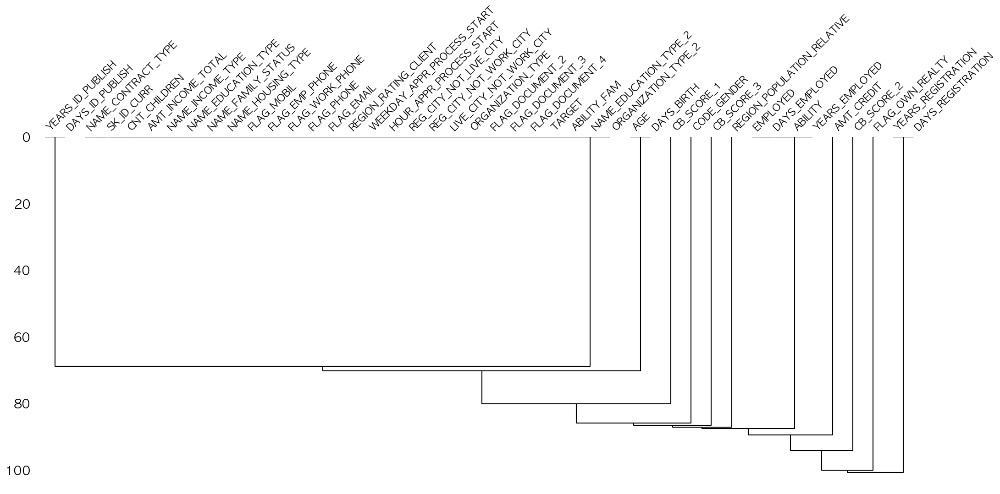

In [54]:
# Dendrogram (Hierarchical clustering)
msno.dendrogram(df)

- 결측치 구분

Dendrogram을 그려 보았을 때 (=Hierarchical clustering을 진행한 결과), 결측이 없는 변수와 결측치 비율이 낮은 순서로 similarity가 있는 것으로 보이며, 이를 통해 해당 데이터에서는 결측치 발생 패턴이 존재하지 않는다고 볼 수 있음. 즉, 해당 데이터의 결측치는 MACR(missing at completely random) type → 결측치 처리에 대해서 결측치를 imputation 하지 않고, fine classing / coarse classing 방법을 이용해 부도예측모형 개발시 활용함.

In [55]:
for col in df.columns:
    if df[col].dtype == 'int64':
        df[col].fillna(-9999999, inplace=True)
    elif df[col].dtype == 'float64':
        df[col].fillna(-9999999.0, inplace=True)
    else:
        df[col].fillna('9999999', inplace=True)

In [56]:
X = df.drop('TARGET', axis = 1)
y = df['TARGET']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 919, stratify = y)

In [57]:
y_train.value_counts()

0    15400
1     1395
Name: TARGET, dtype: int64

- Dummy 변수 생성

In [58]:
# function to create dummy variables
def dummy_creation(df, columns_list):
    df_dummies = []
    for col in columns_list:
        df_dummies.append(pd.get_dummies(df[col], prefix = col, prefix_sep = ':'))
    df_dummies = pd.concat(df_dummies, axis = 1)
    df = pd.concat([df, df_dummies], axis = 1)
    return df

In [59]:
X_train_dummy = dummy_creation(X_train, cat_features_2)
X_train_dummy.shape

(16795, 132)

In [60]:
X_test_dummy = dummy_creation(X_test, cat_features_2)
X_test_dummy.shape

(7198, 133)

In [61]:
X_test_dummy = X_test_dummy.reindex(labels=X_train.columns, axis=1)

## III. Feature Engineering<a class='anchor' id="FE">

In [62]:
X_train_prepr = X_train_dummy.copy()
y_train_prepr = y_train.copy()
X_test_prepr = X_test_dummy.copy()
y_test_prepr = y_test.copy()

Information value - a measure of the predictive power of the independent variable based on the separate categories' WoE values:

### • Information Value<a class='anchor' id="IV">

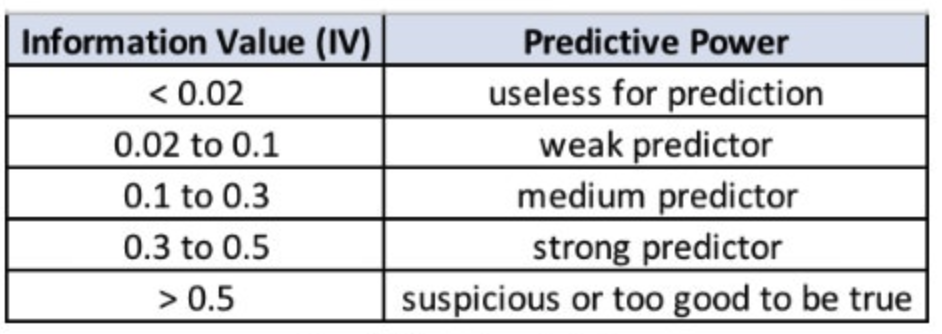

In [63]:
Image("/Users/yonggab/desktop/screenshot/IV.png",width = 500, height = 500)

### • Fine classing and Coarse classing for Categorical features<a class='anchor' id="CA">

- IV for categorical features

In [64]:
def woe_discrete(df, cat_variabe_name, y_df):
    df = pd.concat([df[cat_variabe_name], y_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 0, 1, 3]]
    df.iloc[:,0] = cat_variabe_name
    df.columns = ['Variables','attribute', 'n_obs', 'prop_bad']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_bad'] = df['prop_bad'] * df['n_obs']
    df['n_good'] = (1 - df['prop_bad']) * df['n_obs']

    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    df = df.sort_values(['WoE'])
    df = df.reset_index(drop = True)
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df

In [65]:
res_iv_cat = pd.DataFrame({})
for i in range(len(cat_features_2)) : 
    df_temp = woe_discrete(X_train_prepr, cat_features_2[i], y_train_prepr)
    res_iv_cat = pd.concat([res_iv_cat.reset_index(drop=True),df_temp],axis=0)

In [66]:
IV = pd.DataFrame({'IV':res_iv_cat.groupby('Variables').IV.max()})
IV = IV.reset_index()

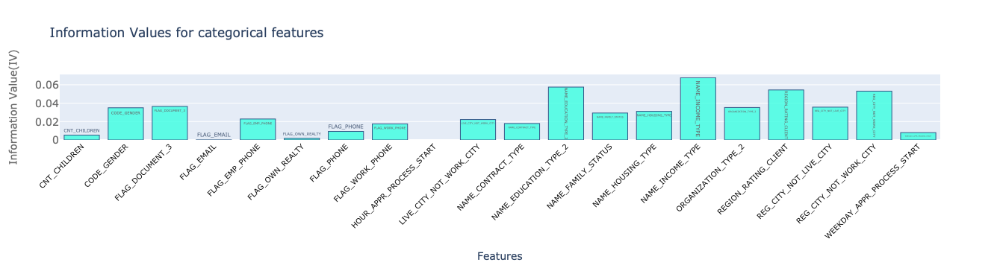

In [67]:
data = [go.Bar(
            x=IV['Variables'],
            y=round(IV['IV'],4),
            text=IV['Variables'],
            marker=dict(
            color='rgb(58,256,225)',
            line=dict(
            color='rgb(8,48,107)',
            width=1,
        )
    ),
    opacity=0.8
    )]

layout = go.Layout(
    title='Information Values for categorical features',
        xaxis=dict(
        tickangle=-45,
        title='Features',
        tickfont=dict(
            size=10,
            color='rgb(7, 7, 7)'
        )
    ),
    yaxis=dict(
        title='Information Value(IV)',
        titlefont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
)

plotly.offline.iplot({
    "data": data,'layout':layout
})

→ IV 0.04이상 변수 고려

- NAME_EDUCATION_TYPE_2

In [68]:
def plot_by_woe(df_WoE, rotation_of_x_axis_labels = 0):
    fig, ax1 = plt.subplots(figsize=(12,6))
    
    index = np.arange(len(df_WoE))
    prop = round(df_WoE.n_obs/df_WoE.n_obs.sum()*100,2)
    ax1.bar(index,height=prop,color='tab:blue')
    for i in range(len(index)):
        plt.text(i, prop[i], str(prop[i])+'%', ha = 'center')
    ax1.set_xlabel(df_WoE.columns[0])
    ax1.set_ylabel('Proportion(%)')
    ax1.set_ylim([0,100])
    ax1.tick_params(axis='x',rotation = rotation_of_x_axis_labels)
    
    ax2 = ax1.twinx()
    x = np.array(df_WoE.iloc[:, 1].apply(str))
    y = df_WoE['prop_bad']
    
    ax2.plot(x, y, marker = 'o', linestyle = '--',color='black')
    ax2.set_xlabel(df_WoE.columns[0])
    ax2.set_ylabel('Bad rate')
    ax2.set_title(str('Bad rate by ' + df_WoE.Variables[1]))
    ax2.tick_params(axis='x',rotation = rotation_of_x_axis_labels)
    plt.show()

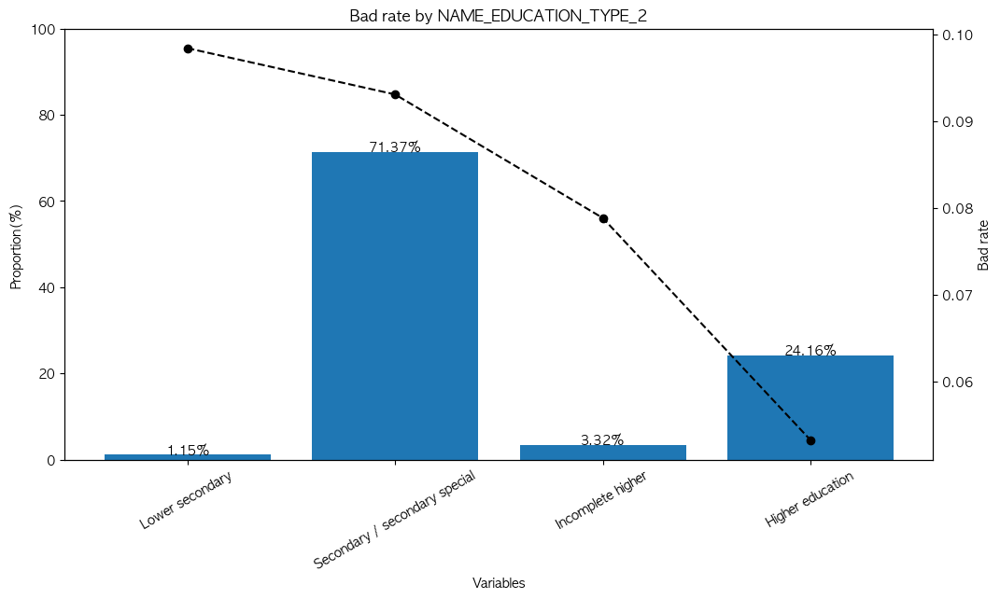

In [69]:
df_temp = woe_discrete(X_train_prepr, "NAME_EDUCATION_TYPE_2", y_train_prepr)
plot_by_woe(df_temp,30)

Lower secondary & Secondary/secondary special → NM_EDU_TYPE1 / Incomplete higher & Higher education → NM_EDU_TYPE2

In [70]:
def edu_f(type):
    if 'secondary' in type.lower():
        return 'NM_EDU_TYPE1'
    else : 
        return 'NM_EDU_TYPE2'

In [71]:
X_train["NM_NAME_EDUCATION_TYPE_2"] = X_train["NAME_EDUCATION_TYPE_2"].apply(edu_f)

- NAME_INCOME_TYPE

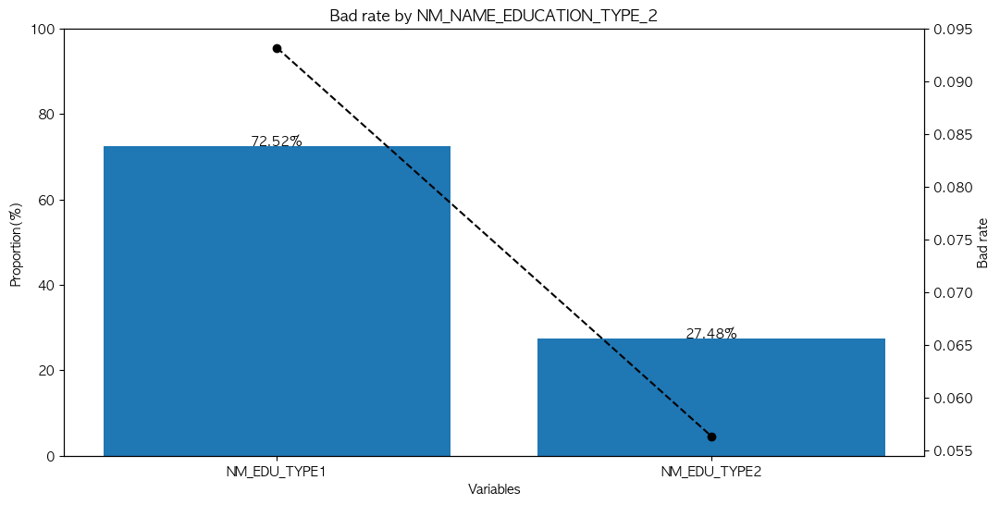

In [72]:
df_temp = woe_discrete(X_train, "NM_NAME_EDUCATION_TYPE_2", y_train)
plot_by_woe(df_temp)

- REGION_RATING_CLIENT

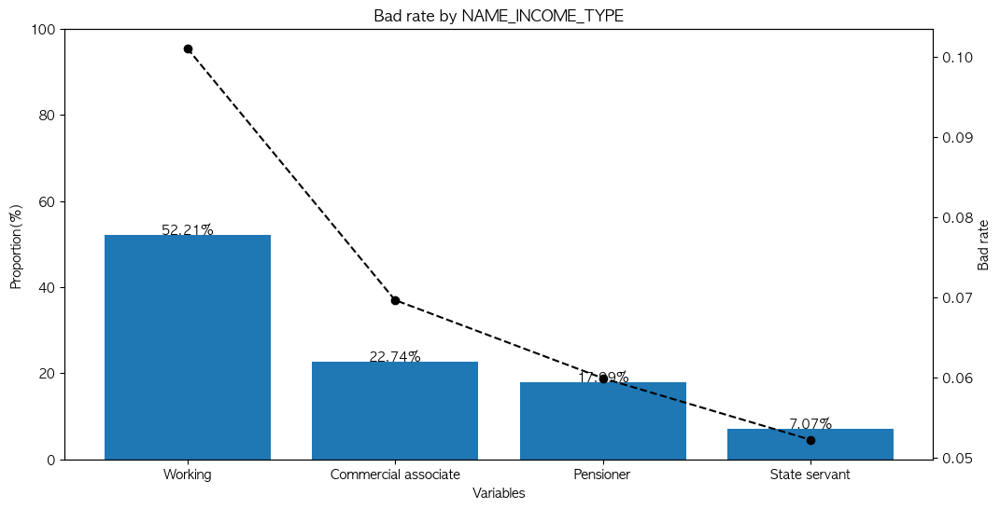

In [73]:
df_temp = woe_discrete(X_train_prepr, "NAME_INCOME_TYPE", y_train_prepr)
plot_by_woe(df_temp)

- REG_CITY_NOT_WORK_CITY

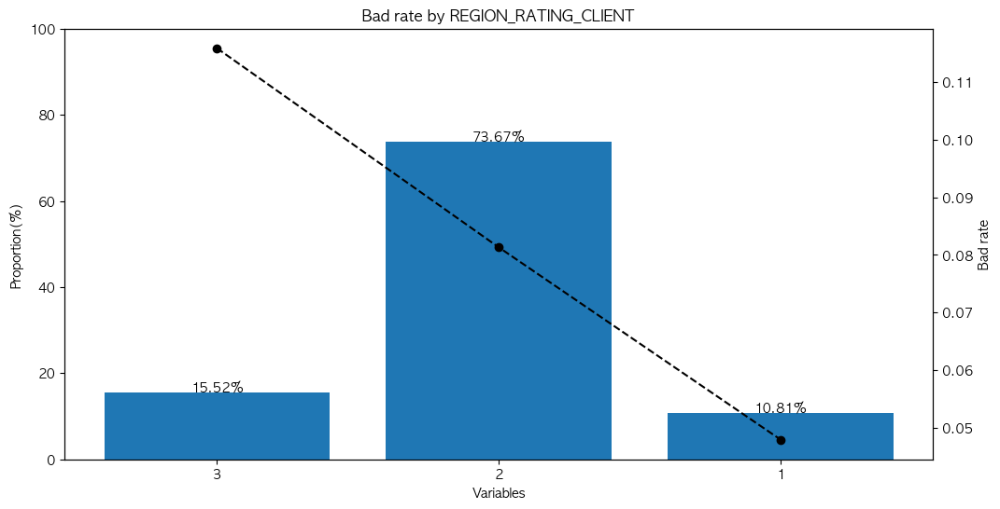

In [74]:
df_temp = woe_discrete(X_train_prepr, "REGION_RATING_CLIENT", y_train_prepr)
plot_by_woe(df_temp)

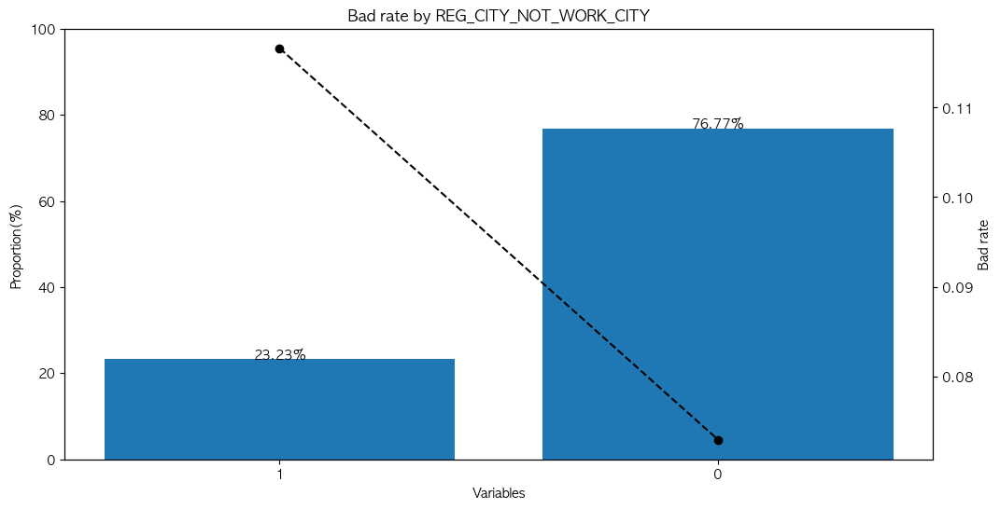

In [75]:
df_temp = woe_discrete(X_train_prepr, "REG_CITY_NOT_WORK_CITY", y_train_prepr)
plot_by_woe(df_temp)

### • Fine classing and Coarse classing for Numerical features<a class='anchor' id="NU">

- IV for numeric features

In [76]:
def woe_ordered_continuous(df, continuous_variabe_name, y_df):
 
    df_new = pd.qcut(df[continuous_variabe_name][df[continuous_variabe_name]!=-9999999],20,duplicates='drop',precision=1)
    df_new_2 = df[continuous_variabe_name][df[continuous_variabe_name]==-9999999]
   
    df = pd.concat([df_new, df_new_2], axis = 0)
    df = pd.concat([df, y_df], axis = 1)
    df[continuous_variabe_name][df[continuous_variabe_name]==-9999999]="[NA]"
    
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 0, 1, 3]]

    
    df.iloc[:,0] = continuous_variabe_name
    df.columns = ['Variables','attribute', 'n_obs', 'prop_bad']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_bad'] = df['prop_bad'] * df['n_obs']
    df['n_good'] = (1 - df['prop_bad']) * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    #df = df.sort_values(['WoE'])
    #df = df.reset_index(drop = True)
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df

In [77]:
res_iv_num = pd.DataFrame({})
for i in range(len(num_features_2)) : 
    df_temp = woe_ordered_continuous(X_train_prepr, num_features_2[i], y_train_prepr)
    res_iv_num = pd.concat([res_iv_num.reset_index(drop=True),df_temp],axis=0)

In [78]:
IV_NUM = pd.DataFrame({'IV':res_iv_num.groupby('Variables').IV.max()})
IV_NUM = IV_NUM.reset_index()

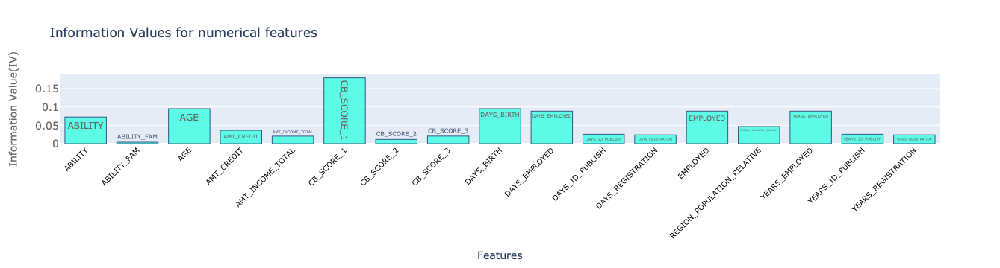

In [79]:
data = [go.Bar(
            x=IV_NUM['Variables'],
            y=round(IV_NUM['IV'],4),
            text=IV_NUM['Variables'],
            marker=dict(
            color='rgb(58,256,225)',
            line=dict(
            color='rgb(8,48,107)',
            width=1,
        )
    ),
    opacity=0.8
    )]

layout = go.Layout(
    title='Information Values for numerical features',
        xaxis=dict(
        tickangle=-45,
        title='Features',
        tickfont=dict(
            size=10,
            color='rgb(7, 7, 7)'
        )
    ),
    yaxis=dict(
        title='Information Value(IV)',
        titlefont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
)

plotly.offline.iplot({
    "data": data,'layout':layout
})

- ABILITY

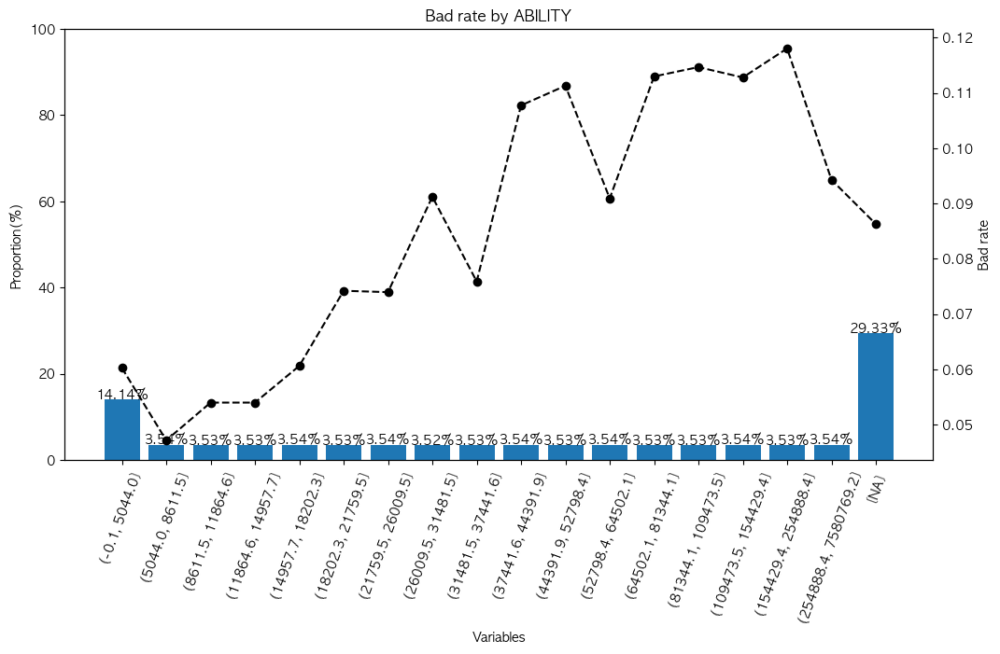

In [80]:
df_temp = woe_ordered_continuous(X_train_prepr, "ABILITY", y_train_prepr)
plot_by_woe(df_temp,70)

In [81]:
def ability_f(num):
    if num <= 18121.1 and num>=0:
        return "[0,18121.1]"
    if num > 18121.1 and num<=44039.8 or num==-9999999: 
        return "(18121.1,44039.8] or NA"
    elif num > 44039.8:
        return "(44039.8,]"
    else :
        return "[NA]"

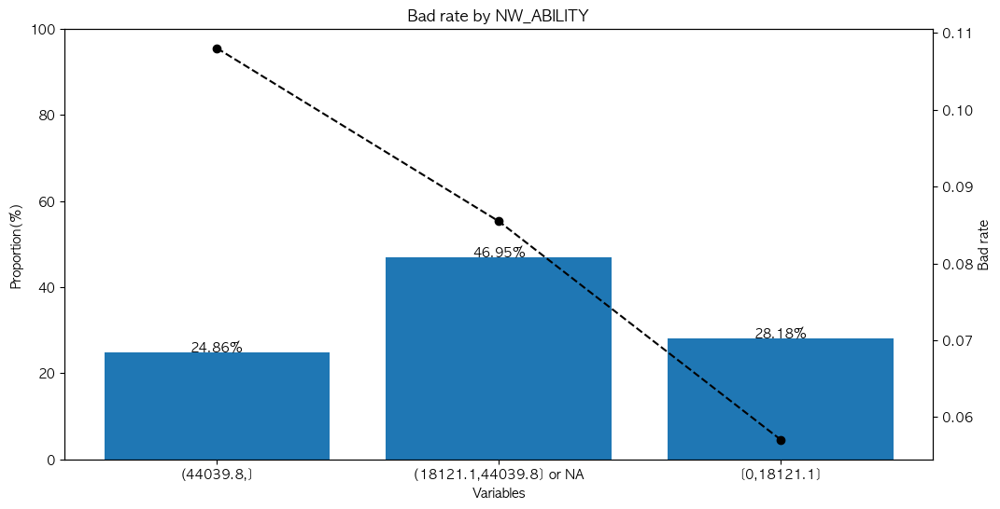

In [82]:
X_train["NW_ABILITY"] = X_train["ABILITY"].apply(ability_f)
df_temp = woe_discrete(X_train, "NW_ABILITY", y_train)
plot_by_woe(df_temp)

- AMT_CREDIT

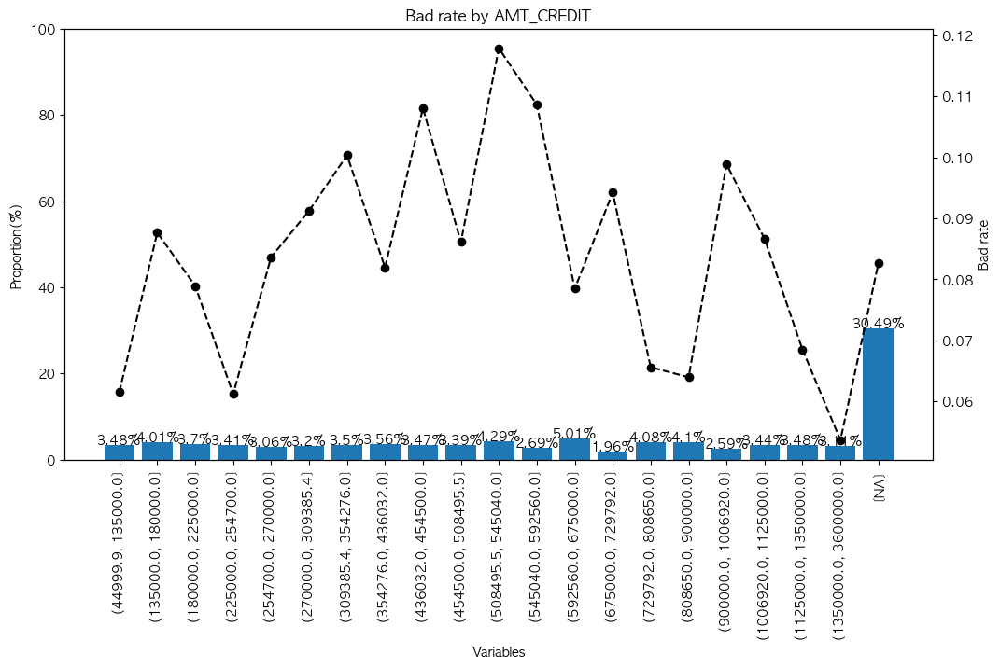

In [83]:
df_temp = woe_ordered_continuous(X_train_prepr, "AMT_CREDIT", y_train_prepr)
plot_by_woe(df_temp,90)

In [84]:
def amt_credit_f(num):
    if num <= 508495.5 or num==-9999999:
        return "[0,508495.5] or NA"
    if num > 508495.5 and num<=808650.0: 
        return "(508495.5, 808650.0]" 
    elif num >  808650.0:
        return "(808650.0,]"
    else :
        return "[NA]"

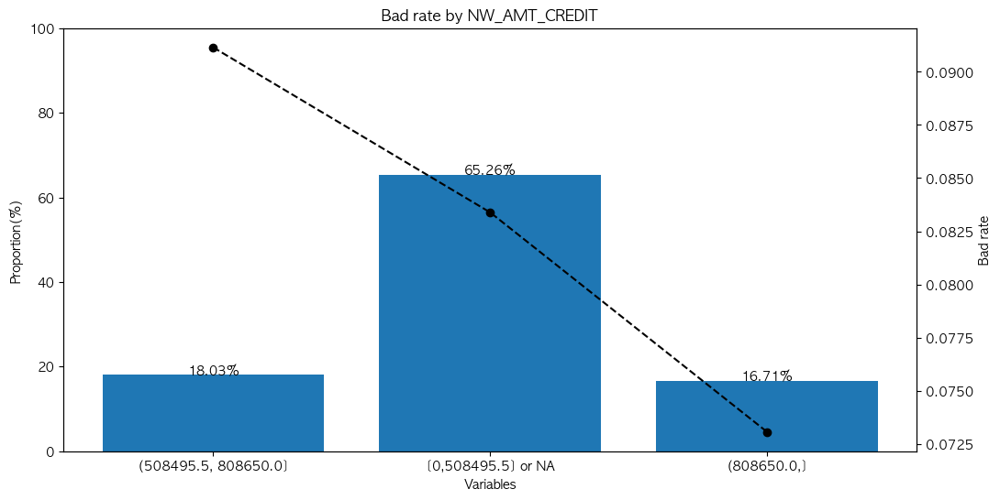

In [85]:
X_train["NW_AMT_CREDIT"] = X_train["AMT_CREDIT"].apply(amt_credit_f)
df_temp = woe_discrete(X_train, "NW_AMT_CREDIT", y_train)
plot_by_woe(df_temp)

- REGION_POPULATION_RELATIVE

0.0466


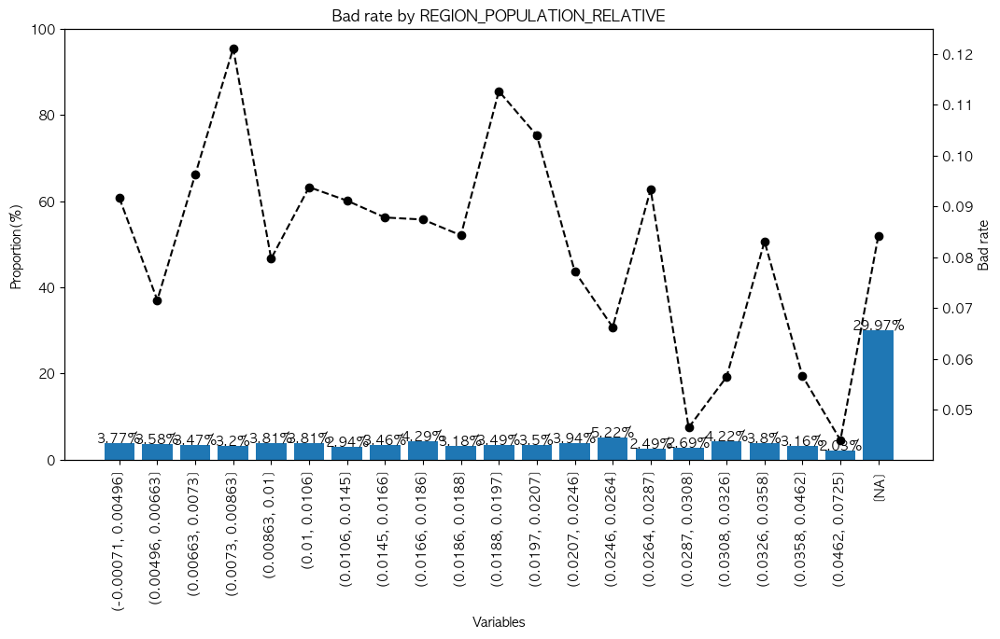

In [86]:
df_temp = woe_ordered_continuous(X_train_prepr, "REGION_POPULATION_RELATIVE", y_train_prepr)
print(round(df_temp.IV.max(),4))
plot_by_woe(df_temp,90)

In [87]:
def region_f(num):
    if num <= -9999999 :
        return "[NA]"
    if num <= 0.0197 :
        return "(,0.0197]"
    elif num > 0.0197:
        return "(0.0197,]"
    else :
        return ""

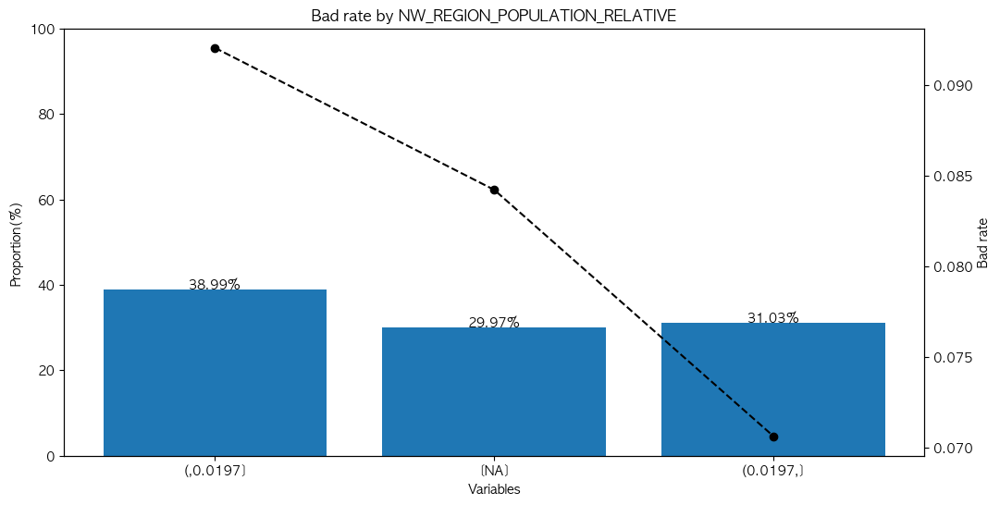

In [88]:
X_train["NW_REGION_POPULATION_RELATIVE"] = X_train["REGION_POPULATION_RELATIVE"].apply(region_f)
df_temp = woe_discrete(X_train, "NW_REGION_POPULATION_RELATIVE", y_train)
plot_by_woe(df_temp)

- CB_SCORE_1

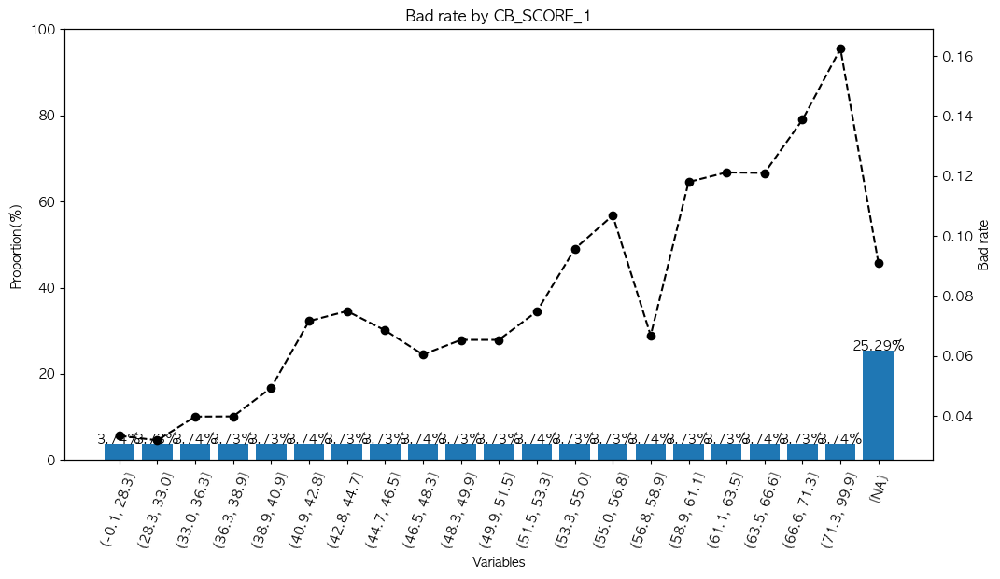

In [89]:
df_temp = woe_ordered_continuous(X_train_prepr, "CB_SCORE_1", y_train_prepr)
plot_by_woe(df_temp,70)

In [90]:
def cb_1_f(num):
    if num <=40 and num>=0 :
        return "(0,40]"
    elif num > 40 and num<= 60 or num==-9999999 :
        return "(40,60] or NA"
    elif num > 60 and num<= 99.9 :
        return "(60,99.9]"
    else :
        return ""

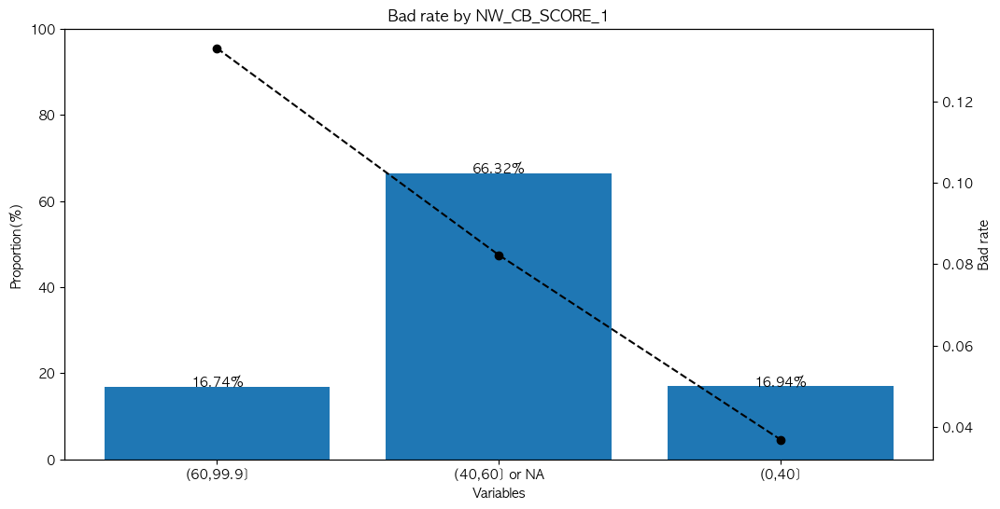

In [91]:
X_train["NW_CB_SCORE_1"] = X_train["CB_SCORE_1"].apply(cb_1_f)
df_temp = woe_discrete(X_train, "NW_CB_SCORE_1", y_train)
plot_by_woe(df_temp)

- DAYS_BIRTHS

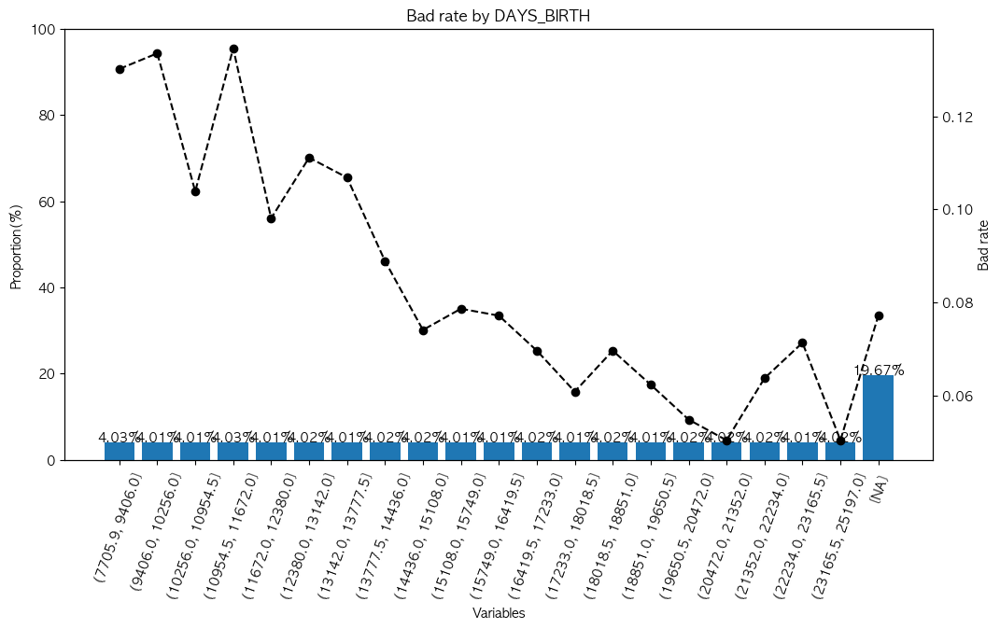

In [92]:
df_temp = woe_ordered_continuous(X_train_prepr, "DAYS_BIRTH", y_train_prepr)
plot_by_woe(df_temp,70)

In [93]:
def age_f(num):
    if num <=12378.0 and num>=0 :
        return "[0,12378.0]"
    elif num > 12378.0 and num<= 17239.2 :
        return "(12378.0,17239.2]"
    elif num > 17239.2 or num==-9999999 :
        return "(17239.2,] or NA"
    else :
        return ""

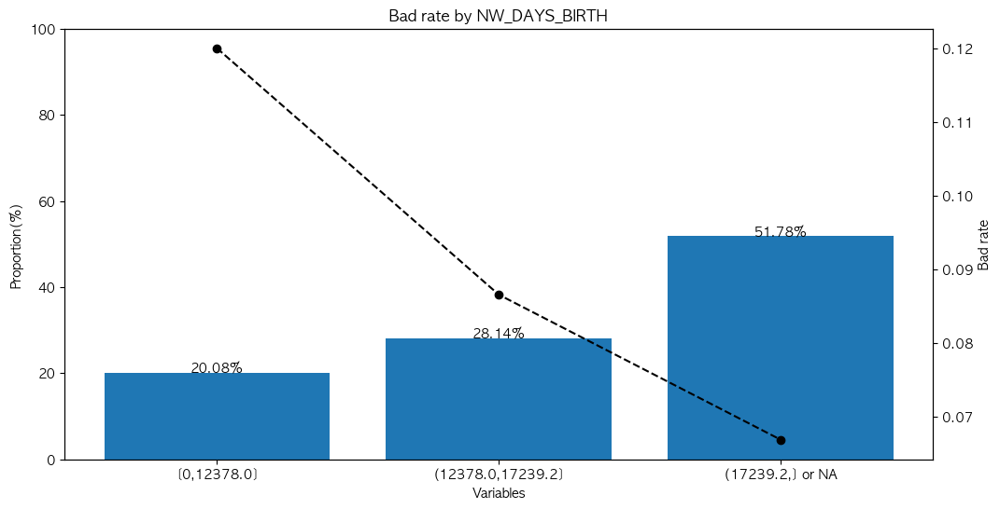

In [94]:
X_train["NW_DAYS_BIRTH"] = X_train["DAYS_BIRTH"].apply(age_f)
df_temp = woe_discrete(X_train, "NW_DAYS_BIRTH", y_train)
plot_by_woe(df_temp)

- DAYS_EMPLOYED

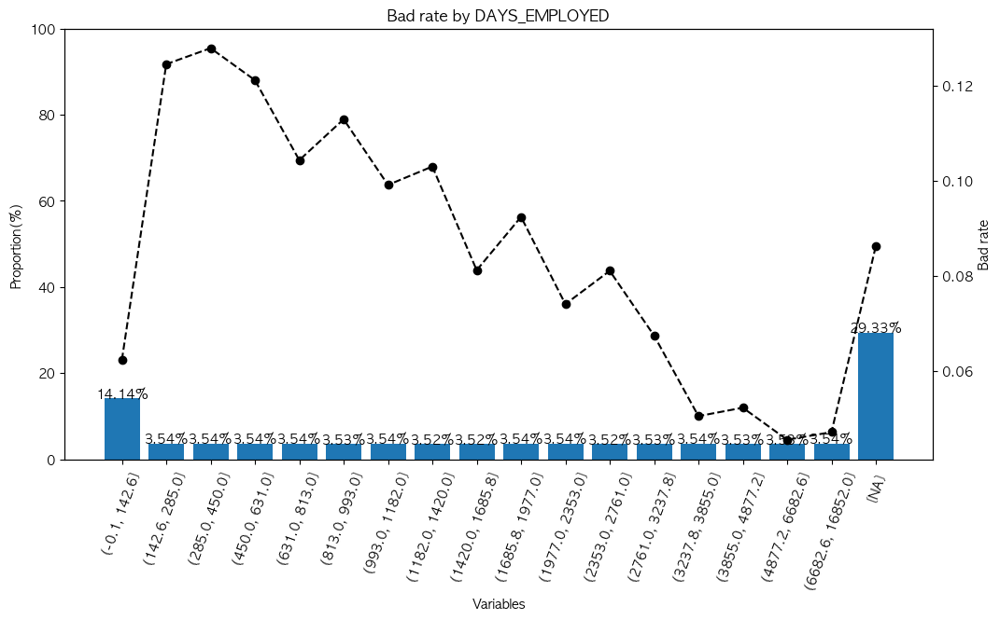

In [95]:
df_temp = woe_ordered_continuous(X_train_prepr, "DAYS_EMPLOYED", y_train_prepr)
plot_by_woe(df_temp,70)

In [96]:
def employ_f(num):
    if num <=451.0:
        return "NA or [,451.0]"
    elif num > 451.0 and num<= 1416.0 :
        return "(451.0,1416.0]"
    elif num > 1416.0 :
        return "(1416.0,]"
    else :
        return ""

### • Candidated Features<a class='anchor' id="CF">

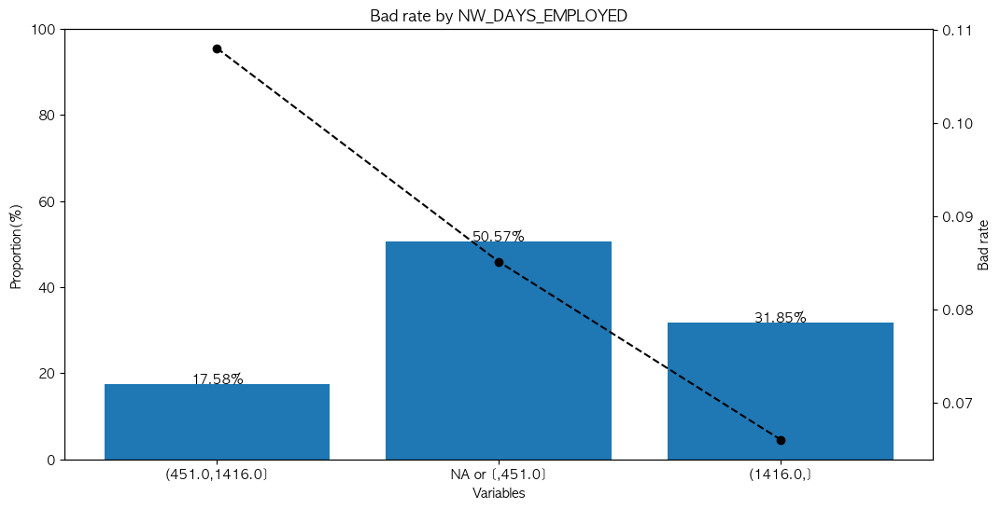

In [97]:
X_train["NW_DAYS_EMPLOYED"] = X_train["DAYS_EMPLOYED"].apply(employ_f)
df_temp = woe_discrete(X_train, "NW_DAYS_EMPLOYED", y_train)
plot_by_woe(df_temp)

- Reference class

In [98]:
selected_features = ['NM_NAME_EDUCATION_TYPE_2','NAME_INCOME_TYPE','REGION_RATING_CLIENT','REG_CITY_NOT_WORK_CITY',
                     'NW_ABILITY','NW_AMT_CREDIT','NW_REGION_POPULATION_RELATIVE','NW_CB_SCORE_1','NW_DAYS_BIRTH',
                      'NW_DAYS_EMPLOYED']
len(selected_features)

10

- Test data 변환

In [99]:
ref_categories = ['NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE1', 
                  'NAME_INCOME_TYPE:Working',
                  'REGION_RATING_CLIENT:3',
                  'REG_CITY_NOT_WORK_CITY:1',
                  'NW_ABILITY:(44039.8,]',
                  'NW_AMT_CREDIT:(508495.5, 808650.0]',
                  'NW_REGION_POPULATION_RELATIVE:(,0.0197]',
                  'NW_CB_SCORE_1:(60,99.9]',
                  'NW_DAYS_BIRTH:[0,12378.0]',
                  'NW_DAYS_EMPLOYED:(451.0,1416.0]']

In [100]:
# Categorical
X_test["NM_NAME_EDUCATION_TYPE_2"] = X_test["NAME_EDUCATION_TYPE_2"].apply(edu_f)

# Numeric
X_test["NW_ABILITY"] = X_test["ABILITY"].apply(ability_f)
X_test["NW_AMT_CREDIT"] = X_test["AMT_CREDIT"].apply(amt_credit_f)
X_test["NW_REGION_POPULATION_RELATIVE"] = X_test["REGION_POPULATION_RELATIVE"].apply(region_f)
X_test["NW_CB_SCORE_1"] = X_test["CB_SCORE_1"].apply(cb_1_f)
X_test["NW_DAYS_BIRTH"] = X_test["DAYS_BIRTH"].apply(age_f)
X_test["NW_DAYS_EMPLOYED"] = X_test["DAYS_EMPLOYED"].apply(employ_f)

In [101]:
X_train_new = dummy_creation(X_train[selected_features],selected_features)
X_test_new = dummy_creation(X_test[selected_features],selected_features)

In [102]:
X_train_new.drop(columns=selected_features,inplace=True)
X_train_new.drop(columns=ref_categories,inplace=True)

In [103]:
X_test_new.drop(columns=selected_features,inplace=True)
X_test_new.drop(columns=ref_categories,inplace=True)

## IV. Prediction model<a class='anchor' id="PD">

In [104]:
X_test_new.shape

(7198, 19)

- Target 부도 : 0 / 정상 : 1로 변환 (모형 개발 시 사용)

In [105]:
y_train.value_counts()

0    15400
1     1395
Name: TARGET, dtype: int64

In [106]:
y_train_new = 1-y_train
y_test_new = 1-y_test

### • Logistic model<a class='anchor' id="LM">

In [107]:
print('Bad rate : %.3f' % (round(sum(y_train == 1) / len(y_train) * 100,4)))

Bad rate : 8.306


In [108]:
reg = LogisticRegression(max_iter=1000, class_weight = 'balanced')
pipeline = Pipeline(steps=[('model', reg)])
cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=5, random_state=1)
scores = cross_val_score(pipeline, X_train_new, y_train_new, scoring = 'roc_auc', cv = cv)
AUROC = np.mean(scores)

print('Mean AUROC: %.4f' % (AUROC))

Mean AUROC: 0.6682


- Coefficient of logistic model

In [109]:
pipeline.fit(X_train_new, y_train_new)

Pipeline(steps=[('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000))])

Coefficient가 마이너스(-)인 변수는 제외 → reference class가 정상비율이 가장 class이므로 부호가 마이너스가 나올 수 없음.

In [110]:
feature_name = X_train_new.columns.values
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(pipeline['model'].coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', pipeline['model'].intercept_[0]]
summary_table.sort_index(inplace = True)
summary_table

,Feature name,Coefficients
0,Intercept,-2.067370
1,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE2,0.573784
2,NAME_INCOME_TYPE:Commercial associate,0.289592
3,NAME_INCOME_TYPE:Pensioner,0.152620
4,NAME_INCOME_TYPE:State servant,0.526390
5,REGION_RATING_CLIENT:1,0.762489
6,REGION_RATING_CLIENT:2,0.393238
7,REG_CITY_NOT_WORK_CITY:0,0.319621
8,"NW_ABILITY:(18121.1,44039.8] or NA",0.253301
9,"NW_ABILITY:[0,18121.1]",0.479603


In [111]:
X_train_new2 = X_train_new.drop(columns=['NW_DAYS_EMPLOYED:(1416.0,]','NW_DAYS_EMPLOYED:NA or [,451.0]'])
X_test_new2 = X_test_new.drop(columns=['NW_DAYS_EMPLOYED:(1416.0,]','NW_DAYS_EMPLOYED:NA or [,451.0]'])

In [112]:
reg = LogisticRegression(max_iter=1000, class_weight = 'balanced')
pipeline = Pipeline(steps=[('model', reg)])
cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=5, random_state=1)
scores = cross_val_score(pipeline, X_train_new2, y_train_new, scoring = 'roc_auc', cv = cv)
AUROC = np.mean(scores)

print('Mean AUROC: %.4f' % (AUROC))

Mean AUROC: 0.6685


In [113]:
pipeline.fit(X_train_new2, y_train_new)

Pipeline(steps=[('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000))])

In [114]:
feature_name = X_train_new2.columns.values
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(pipeline['model'].coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', pipeline['model'].intercept_[0]]
summary_table.sort_index(inplace = True)
summary_table

,Feature name,Coefficients
0,Intercept,-2.080213
1,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE2,0.574935
2,NAME_INCOME_TYPE:Commercial associate,0.291901
3,NAME_INCOME_TYPE:Pensioner,0.001783
4,NAME_INCOME_TYPE:State servant,0.535691
5,REGION_RATING_CLIENT:1,0.773275
6,REGION_RATING_CLIENT:2,0.399886
7,REG_CITY_NOT_WORK_CITY:0,0.325310
8,"NW_ABILITY:(18121.1,44039.8] or NA",0.282183
9,"NW_ABILITY:[0,18121.1]",0.611961


In [115]:
y_hat_test = pipeline.predict(X_test_new2)
y_hat_test_proba = pipeline.predict_proba(X_test_new2)
y_hat_test_proba = y_hat_test_proba[:][: , 1]

In [116]:
y_test_temp = y_test_new.copy()
y_test_temp.reset_index(drop = True, inplace = True)
y_test_proba = pd.concat([y_test_temp, pd.DataFrame(y_hat_test_proba)], axis = 1)
# check the shape to make sure the number of rows is same as that in y_test
y_test_proba.shape

(7198, 2)

In [117]:
y_test_proba.columns = ['y_test_class_actual', 'y_hat_test_proba']
y_test_proba.index = X_test.index
y_test_proba

,y_test_class_actual,y_hat_test_proba
8141,1,0.747605
15846,1,0.644129
16875,1,0.433066
21416,1,0.553880
22693,1,0.254846
...,...,...
20714,1,0.515850
19525,1,0.278034
2444,1,0.546013
60,1,0.354543


- Logistic model 결과

In [118]:
auc = roc_auc_score(y_test_proba['y_test_class_actual'], y_test_proba['y_hat_test_proba'])

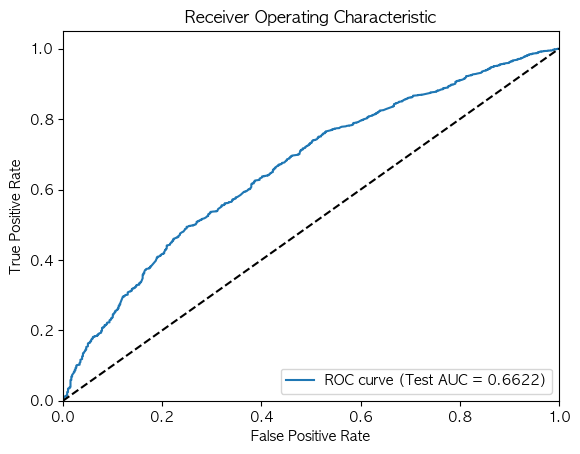

In [119]:
fpr, tpr, _ = roc_curve(y_test_proba['y_test_class_actual'], y_test_proba['y_hat_test_proba'])

plt.figure()
plt.plot(fpr, tpr, label=f'ROC curve (Test AUC = {auc:.4f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

### • Logistic model with ridge penalty<a class='anchor' id="R">

In [120]:
ridge = Ridge()
grid = dict()
grid['alpha'] = arange(0, 1, 0.01)
#grid['alpha'] = [1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=10, random_state=919)
search = GridSearchCV(ridge, grid, scoring='roc_auc', cv=cv, n_jobs=-1)
results = search.fit(X_train_new2, y_train_new)


y_pred_tr = results.predict(X_train_new2)
AUC = roc_auc_score(y_train_new, y_pred_tr)
print('Train Mean AUROC : %.4f' % (AUC))

y_pred_te = results.predict(X_test_new2)
AUC = roc_auc_score(y_test_new, y_pred_te)
print('Test Mean AUROC : %.4f' % (AUC))

Train Mean AUROC : 0.6737
Test Mean AUROC : 0.6604


In [121]:
results.best_params_

{'alpha': 0.89}

- Coefficient of ridge model

In [122]:
best_ridge = results.best_estimator_
best_ridge.fit(X_train_new2, y_train_new)

Ridge(alpha=0.89)

In [123]:
feature_name = X_train_new2.columns.values
summary_table_ridge = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table_ridge['Coefficients'] = np.transpose(best_ridge.coef_)
summary_table_ridge.index = summary_table_ridge.index + 1
summary_table_ridge.loc[0] = ['Intercept', best_ridge.intercept_]
summary_table_ridge.sort_index(inplace = True)
summary_table_ridge

,Feature name,Coefficients
0,Intercept,0.736425
1,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE2,0.039527
2,NAME_INCOME_TYPE:Commercial associate,0.023226
3,NAME_INCOME_TYPE:Pensioner,0.000480
4,NAME_INCOME_TYPE:State servant,0.032023
5,REGION_RATING_CLIENT:1,0.051665
6,REGION_RATING_CLIENT:2,0.032139
7,REG_CITY_NOT_WORK_CITY:0,0.028020
8,"NW_ABILITY:(18121.1,44039.8] or NA",0.023100
9,"NW_ABILITY:[0,18121.1]",0.044461


### • Scorecard<a class='anchor' id="SC">

In [124]:
df_ref_categories = pd.DataFrame(ref_categories, columns = ['Feature name'])
df_ref_categories['Coefficients'] = 0

In [125]:
df_scorecard = pd.concat([summary_table_ridge, df_ref_categories])
df_scorecard
df_scorecard.reset_index(inplace = True)

In [126]:
df_scorecard['Original feature name'] = df_scorecard['Feature name'].str.split(':').str[0]

In [127]:
min_score = 300
max_score = 900

In [128]:
min_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].min().sum()
max_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].max().sum()
df_scorecard['Score - Calculation'] = df_scorecard['Coefficients'] * (max_score - min_score) / (max_sum_coef - min_sum_coef)
df_scorecard.loc[0, 'Score - Calculation'] = ((df_scorecard.loc[0,'Coefficients'] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score
df_scorecard['Score - Preliminary'] = df_scorecard['Score - Calculation'].round()
df_scorecard

,index,Feature name,Coefficients,Original feature name,Score - Calculation,Score - Preliminary
0,0,Intercept,0.736425,Intercept,300.000000,300.0
1,1,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE2,0.039527,NM_NAME_EDUCATION_TYPE_2,68.497199,68.0
2,2,NAME_INCOME_TYPE:Commercial associate,0.023226,NAME_INCOME_TYPE,40.248588,40.0
3,3,NAME_INCOME_TYPE:Pensioner,0.000480,NAME_INCOME_TYPE,0.831152,1.0
4,4,NAME_INCOME_TYPE:State servant,0.032023,NAME_INCOME_TYPE,55.492791,55.0
5,5,REGION_RATING_CLIENT:1,0.051665,REGION_RATING_CLIENT,89.529587,90.0
6,6,REGION_RATING_CLIENT:2,0.032139,REGION_RATING_CLIENT,55.693544,56.0
7,7,REG_CITY_NOT_WORK_CITY:0,0.028020,REG_CITY_NOT_WORK_CITY,48.555376,49.0
8,8,"NW_ABILITY:(18121.1,44039.8] or NA",0.023100,NW_ABILITY,40.030646,40.0
9,9,"NW_ABILITY:[0,18121.1]",0.044461,NW_ABILITY,77.046855,77.0


In [129]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].min().sum()
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].max().sum()
print(min_sum_score_prel)
print(max_sum_score_prel)

300.0
901.0


In [130]:
df_scorecard['Difference'] = df_scorecard['Score - Preliminary'] - df_scorecard['Score - Calculation']
df_scorecard

,index,Feature name,Coefficients,Original feature name,Score - Calculation,Score - Preliminary,Difference
0,0,Intercept,0.736425,Intercept,300.000000,300.0,0.000000
1,1,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE2,0.039527,NM_NAME_EDUCATION_TYPE_2,68.497199,68.0,-0.497199
2,2,NAME_INCOME_TYPE:Commercial associate,0.023226,NAME_INCOME_TYPE,40.248588,40.0,-0.248588
3,3,NAME_INCOME_TYPE:Pensioner,0.000480,NAME_INCOME_TYPE,0.831152,1.0,0.168848
4,4,NAME_INCOME_TYPE:State servant,0.032023,NAME_INCOME_TYPE,55.492791,55.0,-0.492791
5,5,REGION_RATING_CLIENT:1,0.051665,REGION_RATING_CLIENT,89.529587,90.0,0.470413
6,6,REGION_RATING_CLIENT:2,0.032139,REGION_RATING_CLIENT,55.693544,56.0,0.306456
7,7,REG_CITY_NOT_WORK_CITY:0,0.028020,REG_CITY_NOT_WORK_CITY,48.555376,49.0,0.444624
8,8,"NW_ABILITY:(18121.1,44039.8] or NA",0.023100,NW_ABILITY,40.030646,40.0,-0.030646
9,9,"NW_ABILITY:[0,18121.1]",0.044461,NW_ABILITY,77.046855,77.0,-0.046855


In [131]:
df_scorecard['Score - Final'] = df_scorecard['Score - Preliminary']

In [132]:
df_scorecard_F = df_scorecard.sort_values(by=['Original feature name','Score - Final'],ascending=True)
df_scorecard_F.drop(columns='index').reset_index(drop=True)

,Feature name,Coefficients,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,Intercept,0.736425,Intercept,300.000000,300.0,0.000000,300.0
1,NAME_INCOME_TYPE:Working,0.000000,NAME_INCOME_TYPE,0.000000,0.0,0.000000,0.0
2,NAME_INCOME_TYPE:Pensioner,0.000480,NAME_INCOME_TYPE,0.831152,1.0,0.168848,1.0
3,NAME_INCOME_TYPE:Commercial associate,0.023226,NAME_INCOME_TYPE,40.248588,40.0,-0.248588,40.0
4,NAME_INCOME_TYPE:State servant,0.032023,NAME_INCOME_TYPE,55.492791,55.0,-0.492791,55.0
5,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE1,0.000000,NM_NAME_EDUCATION_TYPE_2,0.000000,0.0,0.000000,0.0
6,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE2,0.039527,NM_NAME_EDUCATION_TYPE_2,68.497199,68.0,-0.497199,68.0
7,"NW_ABILITY:(44039.8,]",0.000000,NW_ABILITY,0.000000,0.0,0.000000,0.0
8,"NW_ABILITY:(18121.1,44039.8] or NA",0.023100,NW_ABILITY,40.030646,40.0,-0.030646,40.0
9,"NW_ABILITY:[0,18121.1]",0.044461,NW_ABILITY,77.046855,77.0,-0.046855,77.0


- Score for test data

In [133]:
X_test_scorecard= X_test_new2.copy()
# insert an Intercept column in its beginning to align with the # of rows in scorecard
X_test_scorecard.insert(0, 'Intercept', 1)
X_test_scorecard.head()

,Intercept,NM_NAME_EDUCATION_TYPE_2:NM_EDU_TYPE2,NAME_INCOME_TYPE:Commercial associate,NAME_INCOME_TYPE:Pensioner,NAME_INCOME_TYPE:State servant,REGION_RATING_CLIENT:1,REGION_RATING_CLIENT:2,REG_CITY_NOT_WORK_CITY:0,"NW_ABILITY:(18121.1,44039.8] or NA","NW_ABILITY:[0,18121.1]","NW_AMT_CREDIT:(808650.0,]","NW_AMT_CREDIT:[0,508495.5] or NA","NW_REGION_POPULATION_RELATIVE:(0.0197,]",NW_REGION_POPULATION_RELATIVE:[NA],"NW_CB_SCORE_1:(0,40]","NW_CB_SCORE_1:(40,60] or NA","NW_DAYS_BIRTH:(12378.0,17239.2]","NW_DAYS_BIRTH:(17239.2,] or NA"
8141,1,1,1,0,0,0,1,0,0,1,0,1,1,0,0,1,0,1
15846,1,1,0,0,0,0,1,1,1,0,1,0,0,0,0,1,0,1
16875,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,1
21416,1,0,0,1,0,0,1,1,1,0,0,1,1,0,0,1,0,1
22693,1,0,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0


In [134]:
X_test_scorecard = pd.concat([X_test_scorecard, pd.DataFrame(dict.fromkeys(ref_categories, [0] * len(X_test_scorecard)), 
                                                                         index = X_test_scorecard.index)], axis = 1)
print(X_test_scorecard.shape)

(7198, 28)


In [135]:
scorecard_scores = df_scorecard['Score - Final']
scorecard_scores.shape

(28,)

In [136]:
scorecard_scores = scorecard_scores.values.reshape(28, 1)

In [137]:
y_scores = X_test_scorecard.dot(scorecard_scores)

In [138]:
y_scores = y_scores.rename(columns = {0: 'Score'}, inplace = False)

In [139]:
test_output = pd.merge(y_scores, y_test,left_index=True, right_index=True)

- Test data의 Score 분포 

In [140]:
test_output

,Score,TARGET
8141,732.0,0
15846,683.0,0
16875,554.0,0
21416,637.0,0
22693,437.0,0
...,...,...
20714,617.0,0
19525,443.0,0
2444,587.0,0
60,517.0,0


<AxesSubplot: xlabel='Score', ylabel='Density'>

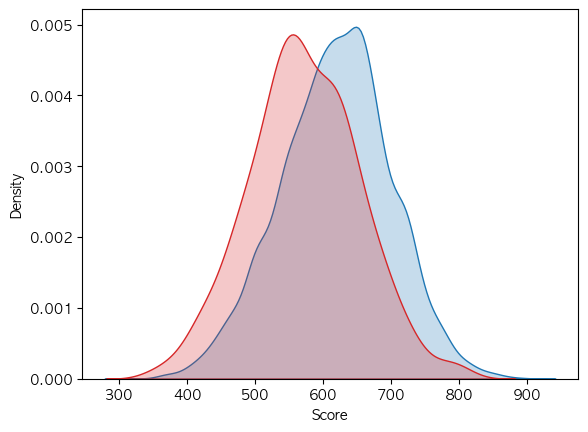

In [141]:
sns.kdeplot(test_output[test_output['TARGET']==0]['Score'],color='tab:blue',fill=True)
sns.kdeplot(test_output[test_output['TARGET']==1]['Score'],color='tab:red',fill=True)

In [142]:
ks = ks_2samp(test_output.loc[test_output.TARGET==0,"Score"], test_output.loc[test_output.TARGET==1,"Score"])
round(ks.statistic,3)

0.252